# Big Data Analytics Project - Airbnb Pricing Prediction <br>

### Group 63 <br>
André Lourenço - 20240743 <br>
Fábio Dos Santos - 20240678 <br>
Rafael Borges - 20240497 <br>
Rui Reis - 20240854 <br>
Victor Silva - 20240663 

## Table of Contents
- [1. Import Libraries](#1-import-libraries)
- [2. Data Integration](#2-data-integration)
  - [2.1 Data Description](#21-data-description)
- [3. Data Content](#3-data-content)
- [4. Missing Values](#4-missing-values)
- [5. Descriptive Statistics and Feature Exploration](#5-descriptive-statistics-and-feature-exploration)
  - [5.1. Number of New Hosts per Year](#51-number-of-new-hosts-per-year)
  - [5.2. Number Superhosts vs Non-SuperHosts](#52-number-superhosts-vs-non-superhosts)
  - [5.3. Host Responses Analysis](#53-host-response-analysis)
  - [5.4. Years Host are Active](#54-years-host-are-active)
  - [5.5. Hosts Characterization](#55-hosts-characterization)
  - [5.6. Property and Room type](#56-property-and-room-type)
  - [5.7. Accomodates](#57-accomodates)
  - [5.8. Bedrooms](#58-bedrooms)
  - [5.9. Amenities](#59-amenities)
  - [5.10. Price](#510-price)
  - [5.11. Reviews](#511-reviews)
  - [5.12. Instant Bookable](#512-instant-bookable)
  - [5.13. Neighborhood](#513-neighborhood)
  - [5.14. Latitude and Longitude](#514-latitude-and-longitude)
  - [5.15. Minimum and Maximum nights](#515-minimum-and-maximum-nights)
- [6. Pairwise Analysis](#6-pairwise-analysis)
  - [6.1. Numeric Features Analysis](#62-numeric-features-analysis)
  - [6.2. Categorical Features Analysis](#63-categorical-features-analysis)

## 1. Import Libraries

__`Step 1`__ Import necessary libraries.

In [0]:
from pyspark.sql.functions import col, year, to_date, avg, regexp_replace, current_date, datediff, countDistinct, sum, round, when, lit, max as spark_max, count, split, size, from_json,explode,array, array_intersect, udf
from pyspark.sql import functions as F
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.patches as mpatches
from pyspark.sql.types import ArrayType, StringType
import pandas as pd
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.stat import Correlation
import scipy.stats as ss
from sklearn.metrics import mutual_info_score

import re

from matplotlib.colors import LinearSegmentedColormap




__`INFO:`__  Setting colour pallet

In [0]:
main_palette = ["#BED62F", "#5C666C", "#A3B18A", "#D9D9D6", "#3A4F52", "#2E2F2F", "#D4E09B", "#ADC178", "#52796F", "#354F52", "#C6D8AF", "#8C9C92", "#7A9E9F", "#A5A58D", "#6B705C", "#FFEFAF", "#B5838D", "#E5989B", "#A98467", "#B7B7A4"]

__`INFO:`__  Load utils funcs

In [0]:
%run "./utils" 

## 2. Data Integration

__`Step 2`__ Import the data from our dataset named "Listings" (https://mavenanalytics.io/data-playground?order=number_of_records%2Cdesc).

In [0]:
# File location and type
file_location = "/FileStore/tables/Listings.csv"
file_type = "csv"

# CSV options
infer_schema = "true"
first_row_is_header = "true"
delimiter = ","

df = spark.read.format("csv") \
    .option("inferSchema", infer_schema) \
    .option("header", "true") \
    .option("sep", ",") \
    .option("quote", '"') \
    .option("escape", '"') \
    .load(file_location)

display(df.limit(5))

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Buttes-Montmartre,null,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,f
3705183,39 mÂ² Paris (Sacre CÅ“ur),10328771,2013-11-29,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Buttes-Montmartre,null,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,f
4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Elysee,null,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,f
4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Vaugirard,null,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,f
4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Passy,null,Paris,48.855,2.26979,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,f


__`Step 3`__ Due to Databricks Community Edition computational limitations our project will focus in Paris, therefore we filter our data to Paris.

In [0]:
# Filter for city equals Paris 
df = df.where(col("city") == "Paris") 

# Display first 10 rows
display(df.limit(10))

# Assess dataframe shape
df_shape(df)

listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
281420,"Beautiful Flat in le Village Montmartre, Paris",1466919,2011-12-03,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Buttes-Montmartre,null,Paris,48.88668,2.33343,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,f
3705183,39 mÂ² Paris (Sacre CÅ“ur),10328771,2013-11-29,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Buttes-Montmartre,null,Paris,48.88617,2.34515,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,f
4082273,"Lovely apartment with Terrace, 60m2",19252768,2014-07-31,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Elysee,null,Paris,48.88112,2.31712,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,f
4797344,Cosy studio (close to Eiffel tower),10668311,2013-12-17,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Vaugirard,null,Paris,48.84571,2.30584,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,f
4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,24837558,2014-12-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,f,Passy,null,Paris,48.855,2.26979,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,f
4898654,NEW - Charming apartment Le Marais,505535,2011-04-13,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Temple,null,Paris,48.86428,2.3537,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",95,2,1125,100,10,10,10,10,10,10,f
6021700,2P - Entre Bastille et Republique,8053690,2013-08-09,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Popincourt,null,Paris,48.86384,2.37101,Entire apartment,Entire place,2,1,"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]",80,2,1125,100,10,10,10,10,10,10,f
6945740,57sqm btw. Bastille & PÃ¨re Lachaise,5924709,2013-04-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Popincourt,null,Paris,48.86043,2.37842,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",59,2,1125,100,10,10,10,10,10,10,f
7491966,Charming appartment near the Parc Buttes Chaumont,35812762,2015-06-14,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Buttes-Chaumont,null,Paris,48.87871,2.37489,Entire apartment,Entire place,2,1,"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",80,2,1125,100,10,10,10,10,10,10,f
7849932,Bel appartement plein de charme !,20833291,2014-09-02,"Paris, Ile-de-France, France",null,null,null,f,1,t,t,Opera,null,Paris,48.8779,2.33122,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Iron"", ""Kitc

64690 rows × 33 columns


### 2.1. Data Description

| Feature                       | Description |
|------------------------------|-------------|
| `listing_id`                 | Unique identifier for each Airbnb listing. |
| `name`                       | Title or name of the Airbnb listing, usually provided by the host. |
| `host_id`                    | Unique identifier for the host who owns the listing. |
| `host_since`                 | Date when the host first joined Airbnb. |
| `host_location`              | Location information of the host. |
| `host_response_time`         | Average time the host takes to respond to inquiries. |
| `host_response_rate`         | Percentage of messages the host responds to. |
| `host_acceptance_rate`       | Percentage of booking requests accepted by the host. |
| `host_is_superhost`          | Whether the host is a Superhost. |
| `host_total_listings_count`  | Total number of listings managed by the host. |
| `host_has_profile_pic`       | Whether the host has uploaded a profile picture. |
| `host_identity_verified`     | Whether the host has verified their identity on Airbnb. |
| `neighbourhood`              | Local neighborhood where the listing is located. |
| `district`                   | District where the listing is located. |
| `city`                       | City where the listing is located. |
| `latitude`                   | Latitude coordinate of the listing. |
| `longitude`                  | Longitude coordinate of the listing. |
| `property_type`              | Type of property listed. |
| `room_type`                  | Type of room offered. |
| `accomodates`                | Maximum number of guests the listing can host. |
| `bedrooms`                   | Number of bedrooms available to guests. |
| `amenities`                  | List of amenities offered. |
| `price`                      | Price per night. |
| `minimum_nights`             | Minimum number of nights required per booking. |
| `maximum_nights`             | Maximum number of nights allowed per booking. |
| `review_scores_rating`       | Overall average rating given by guests. |
| `review_scores_accuracy`     | Rating for how accurate the listing description is. |
| `review_scores_cleanliness`  | Rating for the cleanliness of the listing. |
| `review_scores_checkin`      | Rating for the ease and quality of the check-in process. |
| `review_scores_communication`| Rating for communication with the host. |
| `review_scores_location`     | Rating for the listing's location. |
| `review_scores_value`        | Rating for the value for money. |
| `instant_bookable`           | Whether the listing supports instant booking. |

## 3. Data Type Inspection

__`INFO:`__ Checking for data types in the data

In [0]:
summarize_nulls_and_dtype(df)

column                         |    # nulls | dtype
---------------------------------------------------
listing_id                     |          0 | int
name                           |         62 | string
host_id                        |          0 | int
host_since                     |         33 | date
host_location                  |        168 | string
host_response_time             |     41,344 | string
host_response_rate             |     41,344 | double
host_acceptance_rate           |     32,771 | double
host_is_superhost              |         33 | string
host_total_listings_count      |         33 | int
host_has_profile_pic           |         33 | string
host_identity_verified         |         33 | string
neighbourhood                  |          0 | string
district                       |     64,690 | string
city                           |          0 | string
latitude                       |          0 | double
longitude                      |          0 | double
proper

#### Data Types Conclusions
- The columns `listing_id`, `host_id`, `accommodates`, `price`, `minimum_nights`, and `maximum_nights` are of type `int32` and seems correct. 
- Geolocation columns `latitude`, `longitude`, `host_response_time`, `host_acceptance_rate` and all  `review_scores_X` alike columns are of type `float64` and also seems correct.
- The `bedrooms` is of type `float64`, but should be a discrete integer. Needs further investigation. 
- Categorical features such as `host_is_superhost`, `host_has_profile_pic`, `host_identity_verified`, `property_type`, `room_type`, and `instant_bookable` are stored as `object` and represent binary or qualitative information. Booleans variables can be converted to zeros and ones. 
- The `host_since` column is stored as a `string` (`object`) but represents dates; it should be converted to a `datetime` type for time-based analysis.
- Text-rich columns like `amenities` and `name` are unstructured `object` types and may require parsing or natural language processing (NLP) for advanced insights. Which are not in the scope of this project. 
- Overall, the dataset is well-structured, but **data cleaning and type conversion** are needed before deeper exploration or modeling.

__`INFO:`__ DateType feature `host_since` later will be feature engineered into two new features: `host_days_active` and `host_years_active`. Using most max date as most recent day.

__`INFO:`__ Check if features are actually boolean and if so transform into zeros and ones. 

In [0]:
bool_cols = [
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable"
]

for c in bool_cols:
    # collect distinct values
    distinct_vals = df.select(c).distinct().rdd.flatMap(lambda row: row).collect()
    # count them
    count_vals = len(distinct_vals)
    print(f"{c}: {count_vals} unique value{'s' if count_vals != 1 else ''} → {distinct_vals}")

host_is_superhost: 3 unique values → ['f', 't', None]
host_has_profile_pic: 3 unique values → ['f', 't', None]
host_identity_verified: 3 unique values → ['f', 't', None]
instant_bookable: 2 unique values → ['f', 't']


In [0]:
for c in bool_cols:
    df = df.withColumn(
        c,
        when(col(c) == 't', 1)
        .when(col(c) == 'f', 0)
        .otherwise(None)  # in case there are other values or nulls
        .cast("int")
    )

## 4. Missing Values Inspection

__`INFO:`__ Checking for missing values in the data

In [0]:
summarize_nulls_and_dtype(df, only_missing=True)

column                         |    # nulls | dtype
---------------------------------------------------
name                           |         62 | string
host_since                     |         33 | date
host_location                  |        168 | string
host_response_time             |     41,344 | string
host_response_rate             |     41,344 | double
host_acceptance_rate           |     32,771 | double
host_is_superhost              |         33 | int
host_total_listings_count      |         33 | int
host_has_profile_pic           |         33 | int
host_identity_verified         |         33 | int
district                       |     64,690 | string
bedrooms                       |     13,404 | int
review_scores_rating           |     16,654 | int
review_scores_accuracy         |     16,701 | int
review_scores_cleanliness      |     16,692 | int
review_scores_checkin          |     16,718 | int
review_scores_communication    |     16,699 | int
review_scores_location     

#### Missing Value Conclusions
- A notable number of variables (e.g., `review_scores_rating`, `review_scores_accuracy`, `review_scores_cleanliness`, etc.) have missing values in **16,xxx rows**, suggesting that a considerable portion of listings may not have any reviews.
- The variable `district` has **64,690** missing values, which likely means this attribute is not consistently reported or available for the majority of listings. It can be safely dropped. 
- The variables `host_response_time` and `host_response_rate` both have **41,344** missing entries, suggesting that many hosts might not have been bothered that much by the people who was renting their listing.
- Variable `bedrooms` has **13,404** missing values, which could mean that the data collection process did not capture bedroom count for many listings, or those listings might be shared rooms or unconventional spaces.
- Some host-related attributes like `host_location`, `host_acceptance_rate`, and `review_scores_*` variables have substantial missing data, indicating potential inconsistencies in host profile completeness or listing activity.
- Overall, the dataset has several well-populated core attributes, but auxiliary or review-related fields have significant missingness, which may affect downstream analysis depending on the focus.
- More then one `host_x` alike features has exactaly 33 missing values. This needs to be investigated.




__`INFO:`__: Checking `host_x` missing values overlap

In [0]:
cols = ['host_since',
    'host_is_superhost',
    'host_total_listings_count',
    'host_has_profile_pic',
    'host_identity_verified']

count_null_overlaps(df, cols)

Rows with all 5 columns null at once: 33
✅ No partial overlaps: whenever one is null, they’re all null together.
Out[17]: (33, 0)

In [0]:
df = (
    df
    .na.drop(subset=cols)       # drop 33 rows of na's host_x features
)

__`INFO:`__ Checking if changes were made

In [0]:
summarize_nulls_and_dtype(df, only_missing=True)

column                         |    # nulls | dtype
---------------------------------------------------
name                           |         62 | string
host_location                  |        135 | string
host_response_time             |     41,311 | string
host_response_rate             |     41,311 | double
host_acceptance_rate           |     32,738 | double
district                       |     64,657 | string
bedrooms                       |     13,394 | int
review_scores_rating           |     16,644 | int
review_scores_accuracy         |     16,691 | int
review_scores_cleanliness      |     16,682 | int
review_scores_checkin          |     16,708 | int
review_scores_communication    |     16,689 | int
review_scores_location         |     16,709 | int
review_scores_value            |     16,708 | int


__`INFO:`__ Separating cols into Numeric, Categorical and Binary

In [0]:
numeric_cols = [
    'listing_id', 
    'host_id', 
    'host_response_rate', 
    'host_acceptance_rate',  
    'host_total_listings_count', 
    'latitude', 
    'longitude', 
    'accommodates', 
    'bedrooms', 
    'price', 
    'minimum_nights', 
    'maximum_nights', 
    'review_scores_rating', 
    'review_scores_accuracy', 
    'review_scores_cleanliness', 
    'review_scores_checkin', 
    'review_scores_communication', 
    'review_scores_location', 
    'review_scores_value', 
    ]

categorical_cols = [
    'name', 
    'host_location',
    'host_response_time', 
    'neighbourhood', 
    'district', 
    'city', 
    'property_type', 
    'room_type', 
    'amenities'
    ]

binary_cols = [
    "host_is_superhost",
    "host_has_profile_pic",
    "host_identity_verified",
    "instant_bookable"
]




## 5. Descriptive Statistics and Feature Exploration

__`INFO:`__ Checking descriptive statistics and visualizations of the dataset features.

In [0]:
display(df.describe())

summary,listing_id,name,host_id,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
count,64657,64595,64657,64522,23346,23346,31919,64657,64657,64657,64657,64657,0,64657,64657,64657,64657,64657,64657,51263,64657,64657,64657,64657,48013,47966,47975,47949,47968,47948,47949,64657
mean,2.424035452967196E7,30.5,8.798743249923442E7,null,null,0.8591497472800504,0.8066837933519183,0.12546205360595142,11.7393476344402,0.9965355645947075,0.7702336947275623,null,null,null,48.86419710772815,2.3452838998448846,null,null,3.037876796015899,1.369096619394105,null,113.10461357625624,5.742580076403174,850.9807290780581,93.06462832982734,9.595171579869074,9.206524231370505,9.686938205176332,9.713037858572381,9.685492617001751,9.276794093724583,0.3188208546638415
stddev,1.4326498633772304E7,27.577164466275352,1.048769931390201E8,null,null,0.2804211731930438,0.3024620072900853,0.33124465839073364,71.33348773322648,0.05875786321475151,0.42068573471518905,null,null,null,0.018328693208588244,0.033274840945593506,null,null,1.5883815496498188,0.9528230547799444,null,214.47962577759523,44.88873612901902,39331.708240151995,8.945108391744599,0.8470802280215538,1.107320697043654,0.7755496197988409,0.7675774785047547,0.7020409283242447,0.9430074945696528,0.46602304257616445
min,2577,! IDEAL POUR COURT SEJOUR A PARIS !,2626,Ile-de-France,a few days or more,0.0,0.0,0,0,0,0,Batignolles-Monceau,null,Paris,48.81317,2.22868,Barn,Entire place,0,1,"[""2 r\u00e9frig\u00e9rateur encastr\u00e9s refrigerator"", ""Dishwasher"", ""Essentials"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""TV"", ""Iron"", ""encastr\u00e9 induction stove"", ""Dishes and silverware"", ""Private entrance"", ""First aid kit"", ""Heating"", ""Freezer"", ""Kitchen"", ""Hair dryer"", ""Microwave"", ""Nespresso machine"", ""Fire extinguisher"", ""Cooking basics"", ""Shampoo"", ""Washer \u2013\u00a0In unit"", ""four combin\u00e9 micro onde gril four chaleur tournante oven""]",0,1,1,20,2,2,2,2,2,2,0
max,48091852,ðŸ‡«ðŸ‡·Wonderful Rooftop in Montmartre ðŸ‡«ðŸ‡·,387663988,"ÅodÅº, ÅodÅº Voivodeship, Poland",within an hour,1.0,1.0,1,1105,1,1,Vaugirard,null,Paris,48.90491,2.46705,Treehouse,Shared room,16,50,[],12000,9999,10000000,100,10,10,10,10,10,10,1


#### **Key Observations & Data Understanding**

Based on the initial data exploration, we've gained several insights into the dataset's structure and characteristics:

*   **Categorical String Features:**
    *   `host_response_time`: Contains descriptive string values (e.g., 'a few days or more', 'within an hour') rather than numerical response times.
*   **Numerical Percentage Features:**
    *   `host_response_rate`, `host_acceptance_rate`: Values range between 0 and 1, strongly suggesting they represent percentages.
*   **Boolean Features:**
    *   `host_is_superhost`
    *   `host_has_profile_pic`
    *   `host_identity_verified`
    *   `instant_bookable`
*   **Geospatial Features:**
    *   `latitude`, `longitude`: Values are tightly clustered, consistent with the dataset focusing on listings within Paris.
*   **Standard Categorical Features:**
    *   `neighbourhood`: Appears to be in good order.
    *   `city`: Appears to be in good order.
    *   `property_type`, `room_type`: Appear to be in good order.
*   **List-based Feature (Requires Transformation):**
    *   `amenities`: Represented as lists of strings. These will need to be unpacked into individual binary features for analysis.
        *   **Anomaly Noted:** A peculiar minimum value was observed: `"2 r\u00e9frig\u00e9rateur encastr\u00e9s refrigerator"`, which requires cleaning.

---

### **Potential Data Quality Issues & Areas for Investigation**

Several features exhibit characteristics that warrant further investigation and potential cleaning:

*   **Outliers & Implausible Values:**
    *   `host_total_listings_count`: A significant outlier exists (max: 1105 listings vs. mean: ~12).
    *   `accommodates`, `bedrooms`: Exhibit high maximum values that seem unusually large and should be verified.
    *   `price` (Target Variable): Has a minimum value of 0, which is unrealistic for rental listings.
    *   `minimum_nights`, `maximum_nights`: Display extremely high maximum values (e.g., 9,999 and 10,000,000 respectively), likely acting as placeholders or indicating data entry errors.
*   **Deprecated Feature:**
    *   `district`: This feature appears deprecated and carries no meaningful information. It can likely be dropped.
*   **Curious Pattern:**
    *   `review_X` features (e.g., `number_of_reviews`, `review_scores_rating`, etc.): All noted `review_X` features share a minimum value of 2 and a mean around 9. While not necessarily an error, this consistent pattern is worth noting and understanding in context.

## 6. Numeric Features

### 6.1 Listing_id
Our main concern about this feature is if there are any duplicate listings. Later it will be dropped in the preprocessment, since it dont carries any meaniful information for prediction. 

In [0]:
total_rows   = df.count()
distinct_ids = df.select("listing_id").distinct().count()
duplicates   = total_rows - distinct_ids

print(f"Total rows       : {total_rows:,}")
print(f"Distinct IDs     : {distinct_ids:,}")
print(f"Duplicate rows   : {duplicates:,}")

Total rows       : 64,657
Distinct IDs     : 64,657
Duplicate rows   : 0


In [0]:
cols_to_drop = ['listing_id']

### 6.2 Host_id
This feature will also be dropped in preprocessment. Just by curiosity we assess how many duplicates we have, which are no problem since a host can have more than one listing. 

In [0]:
total_rows   = df.count()
distinct_ids = df.select("host_id").distinct().count()
duplicates   = total_rows - distinct_ids

print(f"Total rows       : {total_rows:,}")
print(f"Distinct IDs     : {distinct_ids:,}")
print(f"Duplicate rows   : {duplicates:,}")

Total rows       : 64,657
Distinct IDs     : 51,923
Duplicate rows   : 12,734


In [0]:
cols_to_drop.append("host_id")

### 6.3 Host Since 
This is DateType as mention before feature was broken down into 2 columns that are more compatible to ML models. And so it will be dropped. 

In [0]:
cols_to_drop.append('host_since')

### 6.4 Host Response Rate

In [0]:
inspect_missing(df, 'host_response_rate')

host_response_rate: 41,311 missing out of 64,657 → 63.89% missing

Showing 10 random rows where `host_response_rate` IS NULL:


listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
34177299,Appartement pour couple,37716644,2015-07-06,"Paris, Ile-de-France, France",null,null,null,0,3,1,0,Palais-Bourbon,null,Paris,48.84955,2.31941,Entire apartment,Entire place,2,null,"[""Shampoo"", ""Iron"", ""Heating"", ""Washer"", ""Hair dryer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Essentials"", ""Private entrance"", ""Long term stays allowed"", ""TV""]",70,1,1125,87,8,9,10,10,10,9,1
9869559,Chambre pour 2 metro Chateau d'Eau,16778922,2014-06-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Enclos-St-Laurent,null,Paris,48.87438,2.35505,Private room in apartment,Private room,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Dryer"", ""Hangers"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Dedicated workspace""]",50,3,1125,null,null,null,null,null,null,null,0
5801026,Large flat Champs Elysees Trocadero,30096345,2015-03-27,"Paris, Ile-de-France, France",null,null,null,1,1,1,1,Passy,null,Paris,48.86551,2.27329,Entire apartment,Entire place,6,2,"[""Patio or balcony"", ""Outlet covers"", ""Dishwasher"", ""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Crib"", ""Long term stays allowed"", ""High chair"", ""Dedicated workspace"", ""Host greets you"", ""Paid parking on premises"", ""TV"", ""Iron"", ""Bathtub"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Ethernet connection"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Coffee maker"", ""Washer"", ""Microwave"", ""Pack \u2019n Play/travel crib"", ""Cooking basics"", ""Cable TV"", ""Room-darkening shades"", ""Paid parking off premises"", ""Shampoo"", ""Extra pillows and blankets"", ""Babysitter recommendations"", ""Bed linens"", ""Carbon monoxide alarm"", ""Elevator""]",127,5,1125,88,9,9,10,9,9,9,1
35416015,Renovated & Luminous Flat in the heart of Paris,25838049,2015-01-09,"Paris, Ile-de-France, France",null,null,0.8,0,1,1,0,Reuilly,null,Paris,48.84064,2.39451,Private room in apartment,Private room,2,1,"[""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",70,2,1125,89,9,9,9,9,9,9,0
38007902,Lovely apartment close to Sacre Coeur & Montmartre,288316781,2019-08-23,FR,null,null,1.0,0,0,1,0,Opera,null,Paris,48.87776,2.34407,Entire apartment,Entire place,4,1,"[""Paid parking off premises"", ""Shampoo"", ""Luggage dropoff allowed"", ""Oven"", ""Heating"", ""Hair dryer"", ""Smoke alarm"", ""Wifi"", ""Dishes and silverware"", ""Refrigerator"", ""Cooking basics"", ""Kitchen"", ""Essentials"", ""Hangers"", ""Long term stays allowed"", ""Coffee maker"", ""TV"", ""Stove"", ""Carbon monoxide alarm""]",135,3,1125,100,10,10,10,10,10,10,1
21712002,Un appartament tres sympa,133636928,2017-06-05,FR,null,null,null,0,1,1,0,Menilmontant,null,Paris,48.87183,2.39473,Entire apartment,Entire place,3,1,"[""Shampoo"", ""Heating"", ""TV"", ""Essentials"", ""Hangers"", ""Wifi"", ""Long term stays allowed""]",160,6,60,90,10,8,10,10,9,9,1
507255,30 mtr ROMANTIC MONTMARTRE - STUDIO,2491914,2012-05-29,"Paris, Ile-de-France, France",null,null,0.73,1,2,1,1,Buttes-Montmartre,null,Paris,48.8846,2.34137,Entire apartment,Entire place,2,null,"[""Dishwasher"", ""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""TV"", ""Iron"", ""Refrigerator"", ""Dishes and silverware"", ""Heating"", 

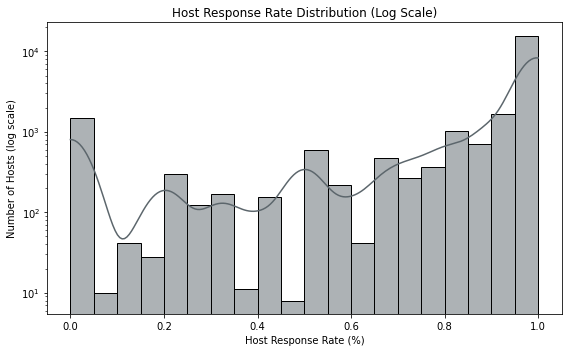

In [0]:
# Filter out null values (invalid response rates)
df_response_filtered = df.filter(col("host_response_rate").isNotNull())

# Convert to Pandas for plotting
response_rate_data = df_response_filtered.select("host_response_rate").toPandas()

# Plot
plt.figure(figsize=(8,5))
sns.histplot(data=response_rate_data, x="host_response_rate", bins=20, kde=True, color="#5C666C")
plt.yscale('log')  
plt.title("Host Response Rate Distribution (Log Scale)")
plt.xlabel("Host Response Rate (%)")
plt.ylabel("Number of Hosts (log scale)")
plt.tight_layout()
plt.show()

__`INFO:`__ Since alomst 2/3 of the values are null, there is not sufficient information to conclude if it is not missing at random and imputation will bias our model, this feature will be dropped.

In [0]:
cols_to_drop.append('host_response_rate')

### 6.6. Host Acceptance Rate

In [0]:
inspect_missing(df, 'host_acceptance_rate')

host_acceptance_rate: 32,738 missing out of 64,657 → 50.63% missing

Showing 10 random rows where `host_acceptance_rate` IS NULL:


listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
18364118,Studio Saint Germain des Pres,127141630,2017-04-23,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Luxembourg,null,Paris,48.85149,2.3332,Entire apartment,Entire place,1,1,"[""Heating"", ""Dedicated workspace"", ""Wifi"", ""Smoke alarm"", ""Kitchen"", ""Long term stays allowed"", ""Host greets you"", ""Luggage dropoff allowed""]",79,3,1125,null,null,null,null,null,null,null,0
7445141,Appartement lumineux et spacieux,18013766,2014-07-12,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Menilmontant,null,Paris,48.86495,2.40266,Entire apartment,Entire place,5,2,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Elevator"", ""Long term stays allowed""]",85,1,1125,null,null,null,null,null,null,null,0
12986796,Small studio in 3rd Marais area,53914476,2016-01-09,"Shibuya, Tokyo, Japan",null,null,null,0,3,1,0,Temple,null,Paris,48.86547,2.35479,Entire apartment,Entire place,2,null,"[""Shampoo"", ""Hair dryer"", ""Essentials"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace""]",35,5,1125,40,6,2,6,8,10,4,0
26799057,Duplex entier Paris CÅ“ur du Marais,169830130,2018-01-25,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Hotel-de-Ville,null,Paris,48.85629,2.36374,Entire apartment,Entire place,3,1,"[""TV"", ""Iron"", ""Hair dryer"", ""Hangers"", ""Smoke alarm"", ""Kitchen"", ""Host greets you"", ""Dedicated workspace"", ""Hot water"", ""Heating"", ""Shampoo"", ""Long term stays allowed"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Luggage dropoff allowed""]",120,2,1125,100,10,10,10,10,10,10,1
21307280,Luminous Flat for 2 near Beaubourg (Paris 3rd),14466356,2014-04-19,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Temple,null,Paris,48.86535,2.35255,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Washer"", ""Hair dryer"", ""Dryer"", ""Wifi"", ""Kitchen"", ""Elevator"", ""First aid kit"", ""Hot water"", ""Essentials"", ""Hangers"", ""Private entrance"", ""Long term stays allowed"", ""TV""]",85,5,1000,97,10,9,10,9,10,9,1
8821584,Sweet and Cosy flat in the 15th,13189047,2014-03-16,"Barcelona, Catalonia, Spain",null,null,null,0,1,1,0,Vaugirard,null,Paris,48.83583,2.29725,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Hot tub"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Wifi"", ""Elevator"", ""Long term stays allowed""]",55,3,1125,null,null,null,null,null,null,null,0
22915152,"SPACIOUS, CHARMING and CENTRAL apartment in Paris",93011789,2016-09-01,"Paris, Ile-de-France, France",null,null,null,1,0,1,1,Popincourt,null,Paris,48.86641,2.3683,Entire apartment,Entire place,3,2,"[""Dishes and silverware"", ""Hangers"", ""Stove"", ""Carbon monoxide alarm"", ""Coffee maker"", ""Iron"", ""Dedicated workspace"", ""Smoke alarm"", ""Essentials"", ""Dishwasher"", ""TV"", ""Shampoo"", ""Lockbox"", ""Heating"", ""Washer"", ""Kitchen"", ""Refrigerator"", ""Cooking basics"", ""Hot water"", ""Oven"", ""Hair dryer"", ""Wifi"", ""Long term stays allowed"", ""Microwave""]",249,2,1125,98,10,10,9,10,10,9,0
5745810,Cosy apartment / Luxembourg Garden,23985077,2014-11-20,Monaco,null,null,null,0,1,1,1,Luxembourg,null,Paris,48.84883,2.3413,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Breakfast"", ""Washer"", ""Dryer"", ""Wifi"", ""Elevator"", ""Long term stays allowed""]",80,14,28,100,10,10,10,10,10,10,0
27301643,Un duplexe familial vue sur le canal Saint Martin,138486216,2017-07-04,"Paris, Ile-de-France

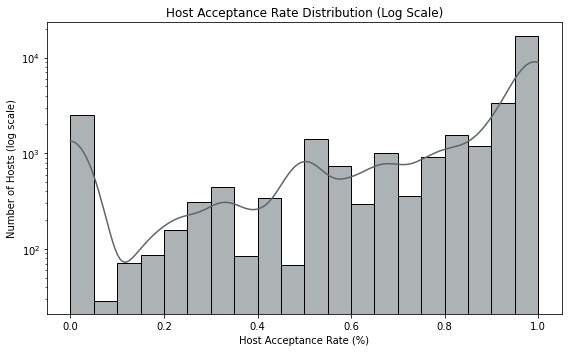

In [0]:
# Filter out null values (invalid acceptance rates)
df_acceptance_filtered = df.filter(col("host_acceptance_rate").isNotNull())

# Convert to Pandas for plotting
acceptance_rate_data = df_acceptance_filtered.select("host_acceptance_rate").toPandas()

# Plot
plt.figure(figsize=(8,5))
sns.histplot(data=acceptance_rate_data, x="host_acceptance_rate", bins=20, kde=True, color="#5C666C")
plt.yscale('log')  
plt.title("Host Acceptance Rate Distribution (Log Scale)")
plt.xlabel("Host Acceptance Rate (%)")
plt.ylabel("Number of Hosts (log scale)")
plt.tight_layout()
plt.show()

__`INFO:`__ Since alomst 1/2 of the values are null; there is not sufficient information to conclude if it is not missing at random; and imputation will bias our model, this feature will be dropped.

In [0]:
cols_to_drop.append('host_acceptance_rate')

### 6.7. Host Total Listing Count

In [0]:
# Filter rows where host_total_listings_count == 0
zero_df = df.filter(col("host_total_listings_count") == 0)

# Count how many such rows there are
zero_count = zero_df.count()
print(f"Number of rows with host_total_listings_count = 0: {zero_count:,}")
display(zero_df.limit(10))

Number of rows with host_total_listings_count = 0: 8,607


listing_id,name,host_id,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
47355968,Charmant appartement parisien - 2/4 voyageurs,11716309,2014-01-28,"Paris, Ile-de-France, France",within a few hours,0.88,0.33,0,0,1,1,Menilmontant,null,Paris,48.8738,2.39408,Entire apartment,Entire place,4,1,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Essentials"", ""Breakfast"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",55,5,1125,100,10,10,10,8,8,8,0
840429,Beautiful studio Menilmontant,4389298,2012-12-12,"Paris, Ile-de-France, France",within a day,0.9,0.57,0,0,1,1,Menilmontant,null,Paris,48.86739,2.38578,Entire apartment,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Dryer"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",43,5,1125,88,9,8,9,9,9,9,0
1272342,Charming Studio Paris Centre,6618901,2013-05-28,"Paris, Ile-de-France, France",within a few hours,0.75,0.5,0,0,1,1,Enclos-St-Laurent,null,Paris,48.87552,2.35488,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Carbon monoxide alarm"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Dishes and silverware"", ""Elevator"", ""Long term stays allowed"", ""Dedicated workspace"", ""Cable TV""]",35,15,1125,81,9,8,10,10,9,8,0
3633049,Cosy appartment/Nid douillet 20Ã¨me,18315024,2014-07-18,"Paris, Ile-de-France, France",within a few hours,0.63,1.0,0,0,1,1,Menilmontant,null,Paris,48.87072,2.40811,Entire apartment,Entire place,4,1,"[""Essentials"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""High chair"", ""Host greets you"", ""Paid parking on premises"", ""TV"", ""Iron"", ""Free street parking"", ""Hot tub"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Cable TV"", ""Shampoo"", ""Extra pillows and blankets"", ""Bed linens"", ""Carbon monoxide alarm"", ""Elevator""]",49,9,1125,96,10,9,9,10,9,9,0
6949834,Charming sunny apt. on small garden,36437406,2015-06-22,"Neuilly-sur-Seine, Ile-de-France, France",a few days or more,0.0,0.5,0,0,1,1,Buttes-Montmartre,null,Paris,48.8878,2.35207,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Garden or backyard"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Refrigerator"", ""Wifi"", ""Dishes and silverware"", ""Elevator"", ""Long term stays allowed""]",60,7,1125,96,10,10,10,10,9,10,0
11314689,appartement Ã Montmartre,12827900,2014-03-05,"Paris, Ile-de-France, France",within a few hours,0.88,0.6,0,0,1,1,Buttes-Montmartre,null,Paris,48.88962,2.34599,Entire apartment,Entire place,2,1,"[""Shampoo"", ""Extra pillows and blankets"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Dryer"", ""Bed linens"", ""Hot water"", ""Hangers"", ""Carbon monoxide alarm"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you""]",70,4,1125,96,9,10,10,10,9,10,0
42559419,3 PiÃ¨ces Champs-Elysees,339001941,2020-02-26,FR,a few days or more,0.0,1.0,0,0,1,0,Elysee,null,Paris,48.87003,2.30115,Entire apartment,Entire place,5,2,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Indoor fireplace"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Dryer"", ""Air conditioning"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace""]",100,7,1125,20,2,2,2,2,2,2,1
44071938,Appartement 110 m2 Paris 1er,353402016,2020-07-04,FR,a few days or more,0.4,1.0,0,0,1,0,Louvre,null,Paris,48.85838,2.34189,Entire ap

__`INFO:`__ Checking if there is an inconsistent between `host_id` and `host_total_listings_count`

In [0]:
# 1) Identify host_ids where host_total_listings_count varies
inconsistent_hosts = (
    df
    .groupBy("host_id")
    .agg(countDistinct("host_total_listings_count").alias("distinct_count"))
    .filter(col("distinct_count") > 1)
    .select("host_id")
)

# 2) Join back to df to pull all rows for those hosts, then order by host_id
inconsistent_rows = (
    df
    .join(inconsistent_hosts, on="host_id", how="inner")
    .orderBy("host_id")
)

# 3) Display the problematic rows
display(inconsistent_rows)


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable


__`INFO:`__ Grouping by `host_id` and counting lisitings to input in `host_total_listings_count`

In [0]:
# 1) For hosts with host_total_listings_count == 0, count how many listings they actually have
zero_counts = (
    df
    .filter(col("host_total_listings_count") == 0)
    .groupBy("host_id")
    .agg(count("*").alias("actual_listings"))
)

# 2) Left-join these counts back to the original DataFrame
df_with_counts = df.join(zero_counts, on="host_id", how="left")

# 3) Overwrite host_total_listings_count only where it was 0
df = df_with_counts.withColumn(
    "host_total_listings_count",
    when(
        col("host_total_listings_count") == 0,
        col("actual_listings")
    ).otherwise(col("host_total_listings_count"))
).drop("actual_listings")



__`INFO:`__ Sanity check if changes had any effect.

In [0]:
# Filter rows where host_total_listings_count == 0
zero_df = df.filter(col("host_total_listings_count") == 0)

# Count how many such rows there are
zero_count = zero_df.count()
print(f"Number of rows with host_total_listings_count = 0: {zero_count:,}")
display(zero_df)

Number of rows with host_total_listings_count = 0: 0


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable


### 6.8. Latitude and Longitude
 
__`INFO:`__ Geographic details is already captured by the `neighbourhood` feature. That is why we decided to drop it. 

In [0]:
cols_to_drop.append('latitude')
cols_to_drop.append('longitude')

### 6.9. Accommodates

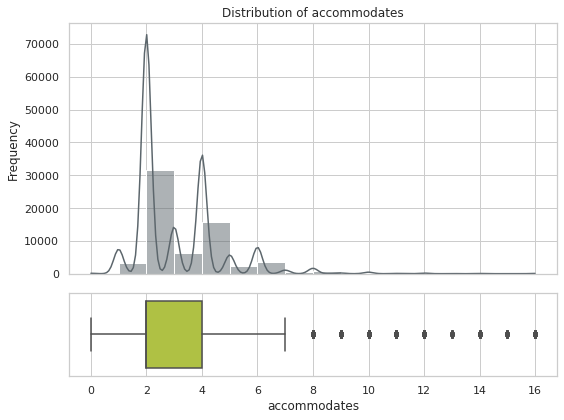

In [0]:
plot_dist_and_box(df, cols = 'accommodates', bins = 16)

%md
#### Conclusions

- Most common number of guests is 2:

  The highest frequency occurs at 2 in the distribution of accommodates, indicating that listings for pairs of guests are most common.

- 2 to 4 guests are Most Prevalent:

  Listings that accommodate between 2 and 4 dominate the distribution, showing a platform focus on small-group travel.

- Higher Accommodate Counts Are Uncommon:

  Listings that accommodate more than 5 guests are rare, with frequency dropping off sharply beyond that point.

- Platform Skewed Toward Small-Scale Lodging:

  The shape of the distribution suggests that Airbnb listings are primarily intended for solo travelers, couples, or small families.




__`INFO:`__

- **1. Winsorization of High `accommodates` Values:**
At higher ranges, differences between individual `accommodates` counts become negligible. To preserve the meaning of these large values while improving distribution, we will apply winsorization during preprocessing.

- **2. Dropping and Imputing Zero `accommodates` Values:**
An `accommodates` value of zero is do not make sense for an Airbnb listing. We will remove those values and later impute missing `accommodates` values in the training set using the median.

In [0]:
df = df.withColumn(
    "accommodates",
    when(df["accommodates"] == 0, lit(None)).otherwise(df["accommodates"])
)

### 6.10. Bedrooms

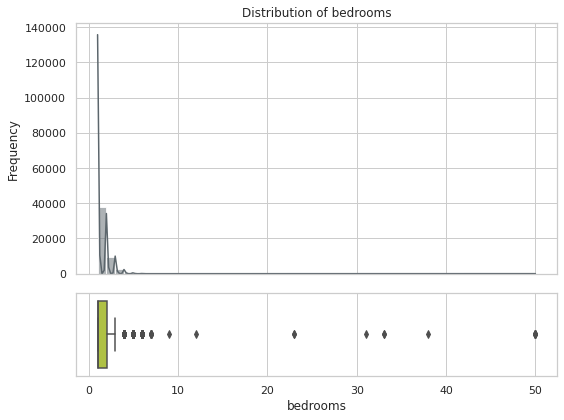

In [0]:
plot_dist_and_box(df, cols = 'bedrooms', bins = 50)

%md
#### Conclusions

- Most Listings Have Only 1 Bedroom:

  The distribution peaks at 1 bedroom, indicating that the majority of listings are compact units such as studios or one-bedroom apartments.

- Two-Bedroom Listings Are Moderately Common:

  Listings with 2 bedrooms show up with much lower but still notable frequency, catering to small families or groups.

- Listings With 3 or More Bedrooms Are Rare:

  There is a sharp drop in frequency beyond 2 bedrooms, and listings with more than 5 bedrooms are extremely uncommon.

- Platform Skewed Toward Small Spaces:

  The overall distribution suggests Airbnb primarily hosts properties suited for couples, solo travelers, and small groups.

- Limited Inventory for Large Groups:

  The scarcity of listings with many bedrooms may present a challenge for larger groups or extended families seeking accommodations.



In [0]:
# Count rows where bedrooms > 2000
high_bedrooms_count = df.filter(col("bedrooms") > 10).count()

print(f"Number of rows with bedrooms > 10: {high_bedrooms_count:,}")

Number of rows with bedrooms > 10: 14


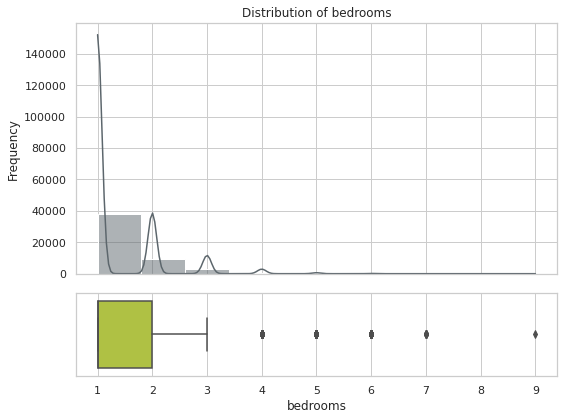

In [0]:
# 1) Filter out rows where bedrooms is zero or greater than 10
df = df.filter(
    col("bedrooms").isNull() | (col("bedrooms") <= 10)
)

# 2) Plot on the filtered DataFrame
plot_dist_and_box(df, cols="bedrooms", bins=10)


In [0]:
df_shape(df)

64643 rows × 33 columns


__`INFO:`__ At higher ranges, differences between individual `bedrooms` counts become negligible. To preserve the meaning of these large values while improving distribution, we will apply winsorization during preprocessing.

### 6.10. Price (TARGET)

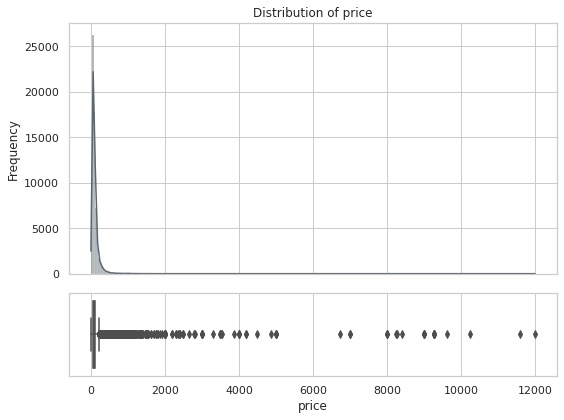

In [0]:
plot_dist_and_box(df, cols = 'price', bins = 300)

%md
#### Conclusions

- Most Listings Are Priced Below $150:

  The highest frequency occurs in the $50–$150 range, indicating that the majority of Airbnb listings fall within an affordable nightly rate.

- Price Distribution Is Right-Skewed:

  The long tail toward higher prices shows that while a few listings are expensive, most remain relatively budget-friendly.

- Luxury Listings Are Rare:

  Listings priced above $300 become progressively less common, with very few reaching the $1000 cap, likely representing high-end or niche offerings.

- Price Cap Reduces Outlier Impact:

  Capping at $1000 helps visualize the overall distribution without being skewed by extreme values, which are likely statistical outliers.

- Platform Remains Accessible to Budget Travelers:

  The distribution supports the idea that Airbnb is widely used for affordable accommodation, with pricing favoring typical travelers over luxury-seekers.



In [0]:
# Count rows where price > 2000
high_price_count = df.filter(col("price") > 500).count()

print(f"Number of rows with price > 500: {high_price_count:,}")

Number of rows with price > 500: 821


__`INFO:`__ To improve our data distribution and prevent bias in the model, we dropped all listings with a `price` above 500—these values are not representative of the majority of our dataset—and also removed any listings where `price` was zero, since a zero price does not make sense for an Airbnb listing.

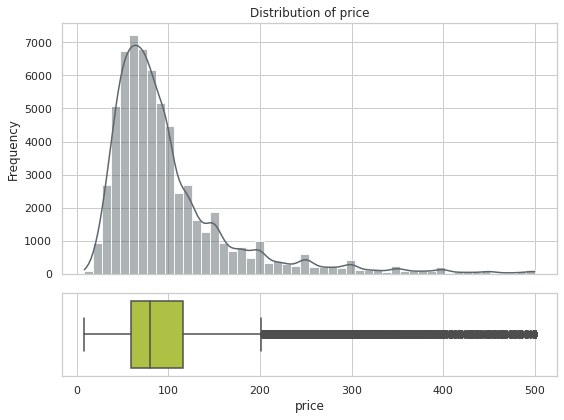

In [0]:
# 1) Filter out rows where price is zero or greater than 500
df = df.filter((col("price") > 0) & (col("price") <= 500))

# 2) Plot on the filtered DataFrame
plot_dist_and_box(df, cols="price", bins=50)


### 6.11. Minimum Nights 

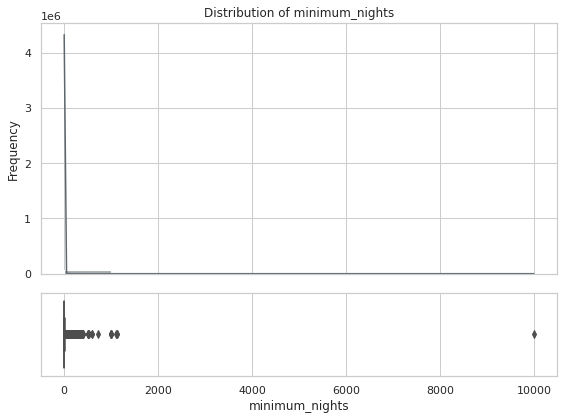

In [0]:
plot_dist_and_box(df, cols = 'minimum_nights', bins = 10)

In [0]:
# Count rows where minimum_nights > 40
high_price_count = df.filter(col("minimum_nights") > 40).count()

print(f"Number of rows with minimum_nights > 40: {high_price_count:,}")

Number of rows with minimum_nights > 40: 813


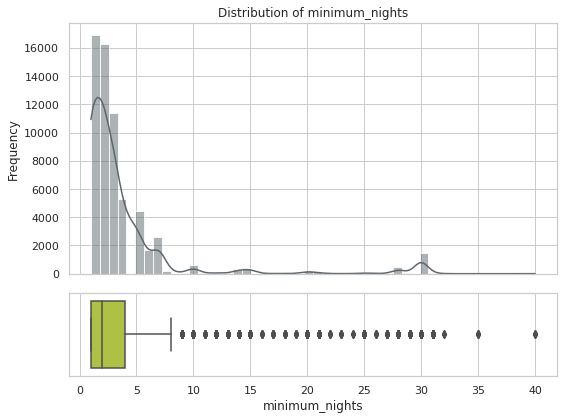

In [0]:
# 1) Filter out rows where minimum_nights is zero or greater than 40
df_filtered = df.filter(col("minimum_nights") <= 40)

# 2) Plot on the filtered DataFrame
plot_dist_and_box(df_filtered, cols="minimum_nights", bins=50)



#### Conclusions

- Most listings require a short minimum stay, typically between 1 and 7 nights. This is consistent with the nature of short-term rental platforms.

- The highest frequency is observed at 1 night, meaning many hosts allow one-night bookings, which may appeal to travelers seeking flexibility.

- The distribution is right-skewed, with a long tail extending toward higher values, indicating a small number of listings with unusually long minimum stay requirements.

- Several outliers exist with values over 20 nights — in some cases approaching 40 — suggesting that some hosts target medium- to long-term stays, or these values could be data anomalies.

- If the goal is to analyze short-term rental behavior, these high minimum-night listings might need to be treated separately or filtered out.


### 6.12. Maximum Nights 

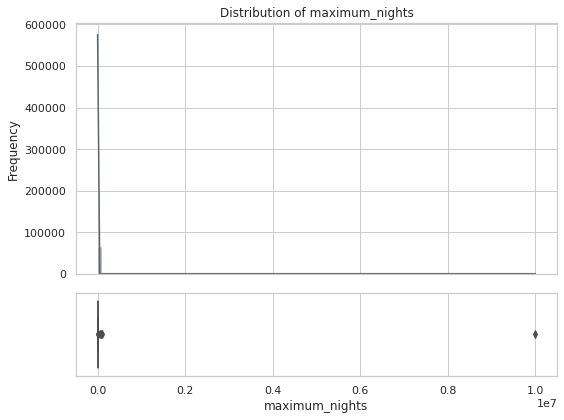

In [0]:
plot_dist_and_box(df, cols = 'maximum_nights', bins = 100)

__`INFO:`__ Drop clear outlier to improve visualization

In [0]:
# Count rows where price > 1150
high_max_nights_count = df.filter(col("maximum_nights") > 1150).count()

print(f"Number of rows with maximum_nights > 1150: {high_max_nights_count:,}")

Number of rows with maximum_nights > 1150: 10


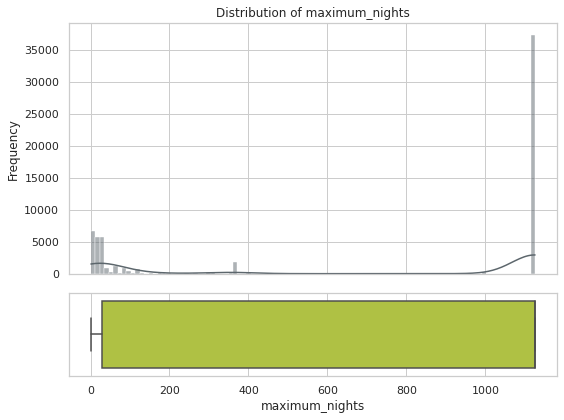

In [0]:
df = df.filter(col("maximum_nights") <= 1150)

plot_dist_and_box(df, cols = 'maximum_nights', bins = 100)


#### Conclusions

- The distribution of `maximum_nights` is heavily right-skewed, with a dense concentration of listings allowing bookings for short-to-moderate durations (especially below 100 nights).

- A prominent spike is visible at 1125 nights, which is likely a default or placeholder value used by the platform or by hosts who do not wish to set an explicit cap.

- The long right tail and the flat density between 200 and 1000 nights suggest that very high maximum stay limits are uncommon and irregular.

- The majority of listings appear to support both short and flexible longer stays, but the sharp peak at the high end may distort analysis and should be carefully handled.



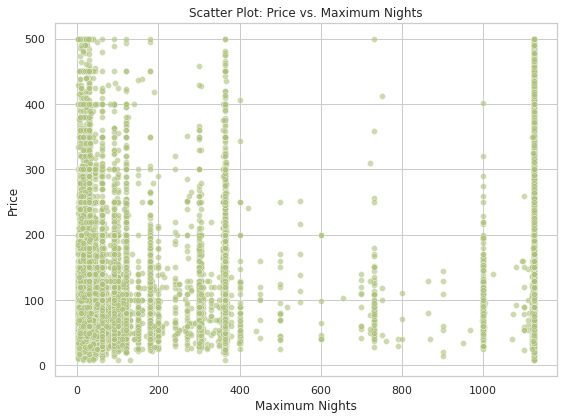

In [0]:
# Replace `df_listings` with your actual DataFrame name
pdf = df.select("price", "maximum_nights").dropna().toPandas()

plt.figure(figsize=(8, 6))
sns.scatterplot(data=pdf, x="maximum_nights", y="price", color="#ADC178",alpha=0.6)
plt.xlabel("Maximum Nights")
plt.ylabel("Price")
plt.title("Scatter Plot: Price vs. Maximum Nights")
plt.tight_layout()
plt.show()

__`INFO:`__ Since distribution is highly skewed and scatter with target don't seems to carry much information about it we will drop this feature later

In [0]:
cols_to_drop.append('maximum_nights')

### 6.13. All Review Scores 

In [0]:
review_cols = [
    'review_scores_rating', 
    'review_scores_accuracy', 
    'review_scores_cleanliness', 
    'review_scores_checkin', 
    'review_scores_communication', 
    'review_scores_location', 
    'review_scores_value'
    ]

In [0]:
count_null_overlaps(df, review_cols)

Rows with all 7 columns null at once: 16,192
❌ Found 102 rows with some nulls but not all.
Out[56]: (16192, 102)

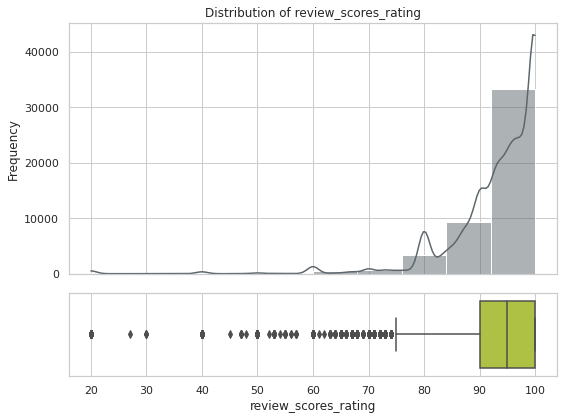

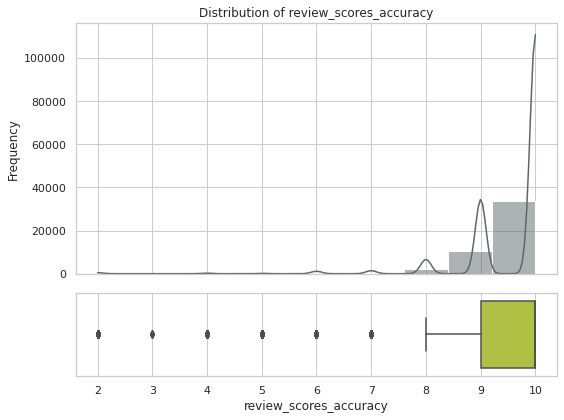

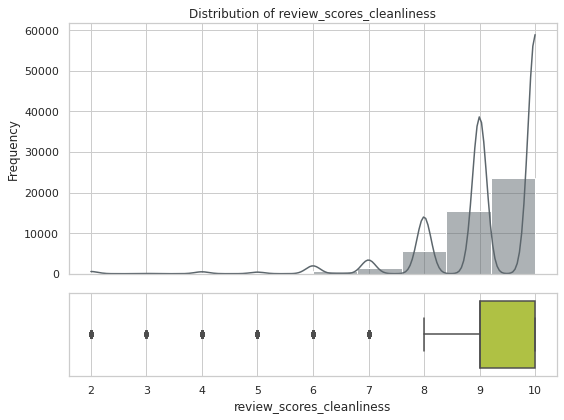

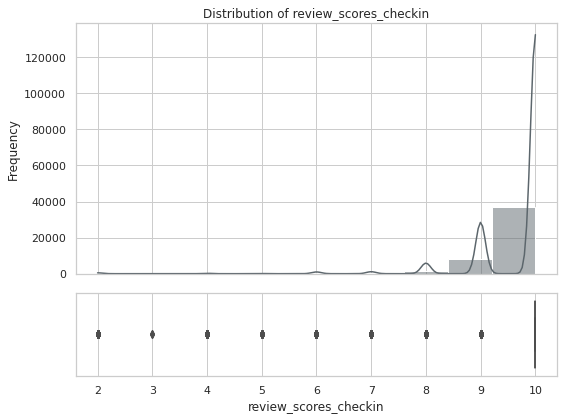

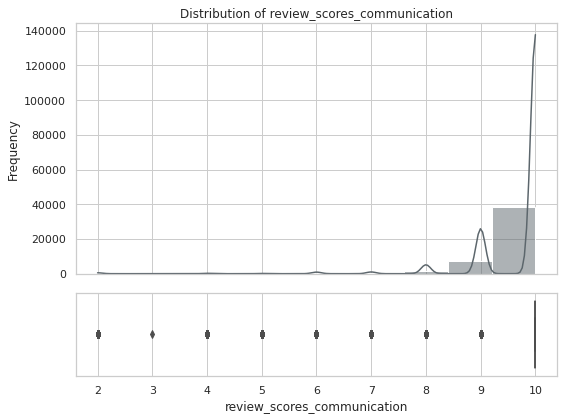

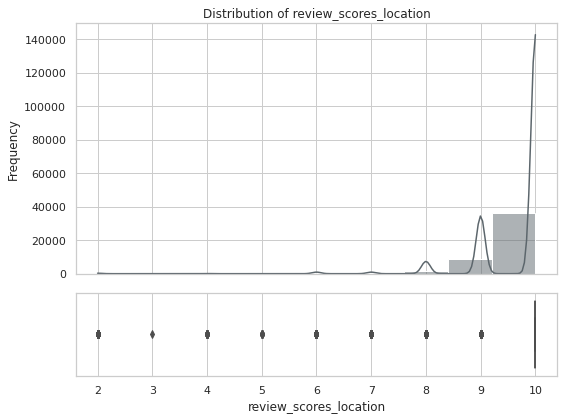

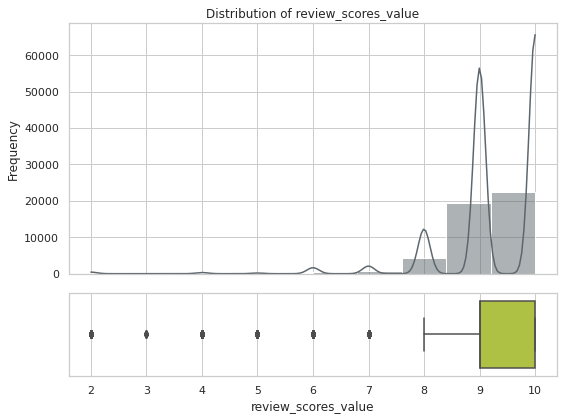

In [0]:
plot_dist_and_box(df, review_cols, bins = 10)

%md
#### Conclusions

- Most Listings Receive Very High Ratings:

  The majority of `review_scores_rating` values fall between 90 and 100, indicating consistently high guest satisfaction across the platform.

- Distribution Is Right-Skewed:

  The histogram and KDE curve show a strong concentration at the high end, with very few listings receiving low scores.

- Presence of Low-Score Outliers:

  The boxplot reveals a number of outliers with ratings below 80, suggesting occasional poor experiences, but these are relatively uncommon.

- Review System Favors Positive Ratings:

  The compressed distribution in the upper range may reflect social or platform bias toward leaving positive feedback.

- High Scores Are a Key Platform Strength:

  The tight cluster of high scores reinforces Airbnb’s perception as a guest-focused platform with generally reliable host quality.



__`INFO:`__ The distributions of individual review scores are highly skewed and redundant, so we will keep only `review_scores_rating`, which encapsulates all other review metrics. Any missing values in this column will be imputed with the median during preprocessing.


In [0]:
cols_to_drop.append('review_scores_accuracy')
cols_to_drop.append('review_scores_cleanliness')
cols_to_drop.append('review_scores_checkin')
cols_to_drop.append('review_scores_communication')
cols_to_drop.append('review_scores_location')
cols_to_drop.append('review_scores_value')

## 7. Binary Features
### 7.1. Is Super Host ? 

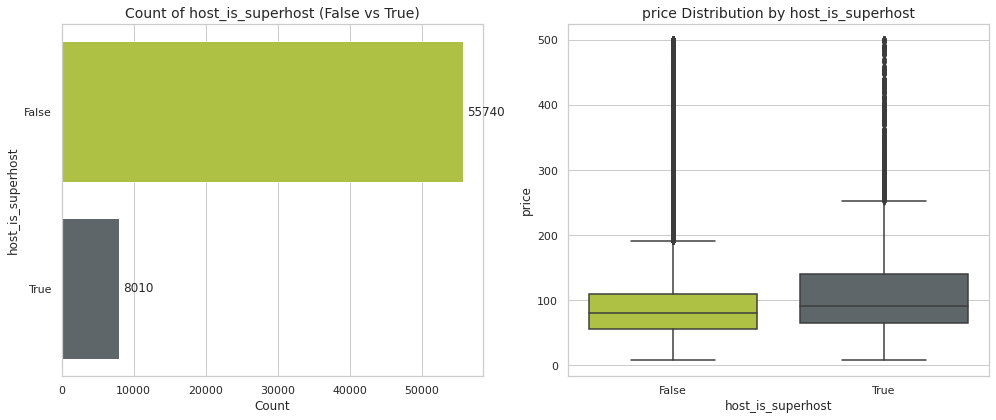

In [0]:
plot_binary_with_target(df, "host_is_superhost", 'price')

%md
#### Conclusions

- Majority of Hosts Are Not Superhosts:

  The vast majority of hosts do not hold Superhost status. This suggests that becoming a Superhost is relatively rare.

- Superhost Status is Selective:

  The relatively small number of Superhosts indicates that Airbnb maintains strict criteria for achieving this recognition, emphasizing consistent high-quality hosting.


- Opportunity for Differentiation:

  Hosts can leverage Superhost status as a competitive advantage, signaling reliability and excellence to potential guests.

- Platform Standards Enforcement:

  The data may also reflect Airbnb’s efforts to uphold hosting standards by rewarding only top-performing hosts with the Superhost label.



### 7.2. Has Profile Pic ?

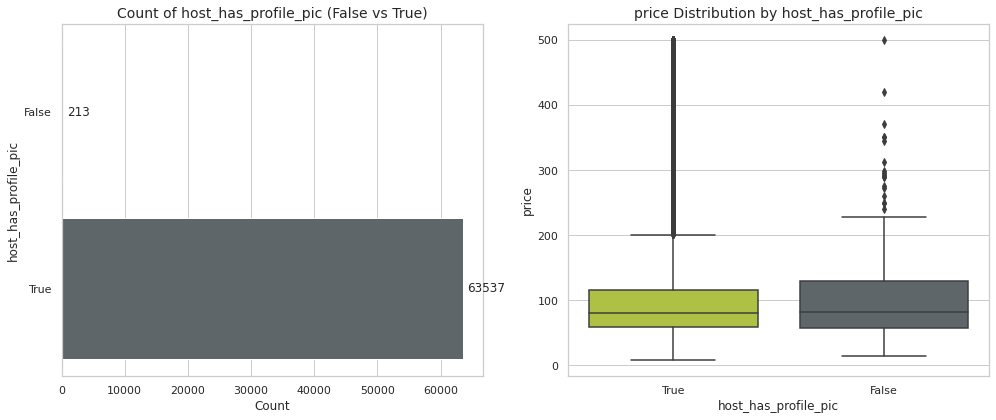

In [0]:
plot_binary_with_target(df, "host_has_profile_pic", 'price')


### 7.3. Has Identity Verified ?


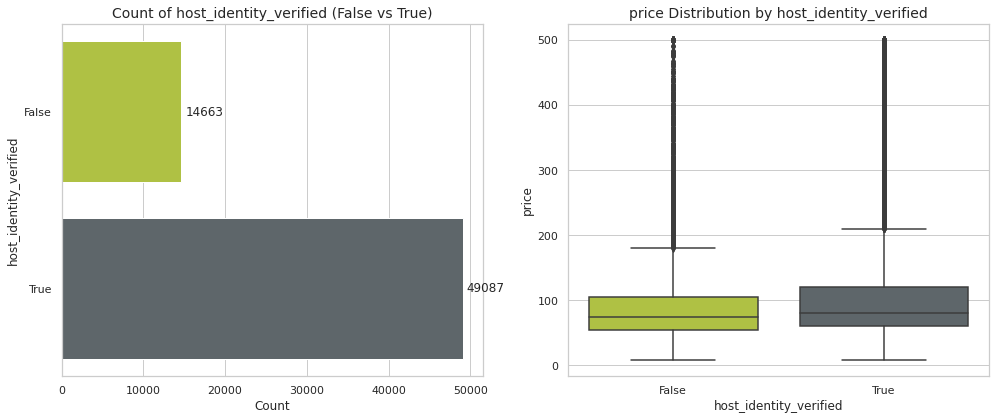

In [0]:
plot_binary_with_target(df, "host_identity_verified", 'price')

#### Conclusions

- Most Hosts Have Profile Pictures:

  The vast majority of hosts have uploaded a profile picture, which helps build trust and improves transparency on the platform.

- Identity Verification Is Widespread:

  Most hosts have verified their identity, indicating strong adherence to Airbnb’s safety and trust standards.

- Platform Encourages Trust Signals:

  These high adoption rates suggest that Airbnb either requires or strongly incentivizes hosts to complete profile and identity verification steps.

- Guest Confidence Likely Increased:

  With most hosts being both verified and visually identifiable, guests are more likely to feel secure when booking.

- Low Incidence of Unverified Profiles:

  Only a small number of hosts lack a profile picture or verification, which may reflect inactive, new, or legacy accounts.


### 7.3. Is Instant Bookable ?

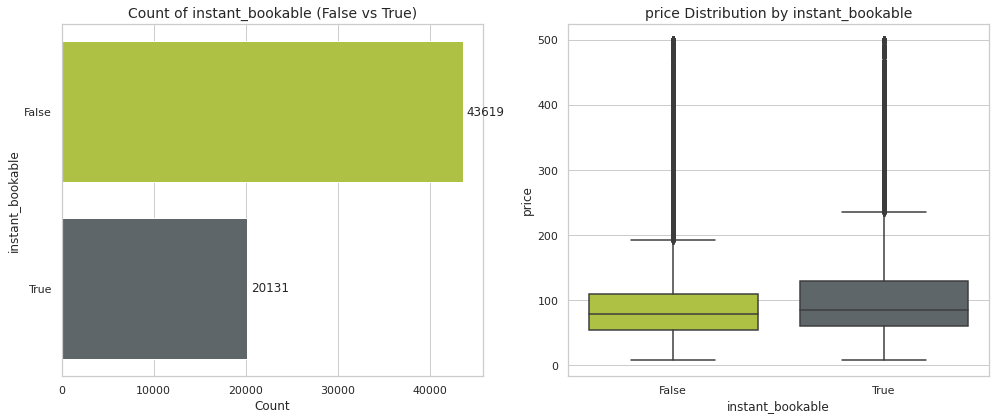

In [0]:
plot_binary_with_target(df, "instant_bookable", 'price')

#### Conclusions

- Most Listings Do Not Support Instant Booking:

  The majority of listings have `instant_bookable` set to false, indicating that hosts prefer to manually approve booking requests.

- Instant Booking Is Common but Not Dominant:

  A significant number of listings do support instant booking, showing that the feature is well-adopted but not yet standard across the platform.

- Host Control May Still Be a Priority:

  The prevalence of manual booking suggests many hosts value the ability to screen guests or control their calendar more tightly.

- Guest Convenience May Be Impacted:

  For guests seeking quick confirmation, the lower share of instant-bookable listings may introduce friction or delay in the booking process.

- Potential Growth Area for Airbnb:

  Encouraging more hosts to enable instant booking could streamline the platform experience and improve conversion rates.



## 8. Categorical Features

### 8.1 Name


__`INFO:`__ Extracting meaningful insights from this feature would require an NLP model, which is beyond the scope of this project. Therefore, we will drop this feature.



In [0]:
cols_to_drop.append('name')

### 8.2 Host Location 

In [0]:
distinct_locations = df.select("host_location").distinct()
print(f"Distinct host_location values count: {distinct_locations.count()}")
distinct_locations.show(truncate=False)

Distinct host_location values count: 2203
+-----------------------------------------------------------+
|host_location                                              |
+-----------------------------------------------------------+
|Lyon, Rhone-Alpes, France                                  |
|Toulouse, Languedoc-Roussillon-Midi-Pyrenees, France       |
|null                                                       |
|Hericy, Ile-de-France, France                              |
|Mexico City, Federal District, Mexico                      |
|Pau, Aquitaine-Limousin-Poitou-Charentes, France           |
|Caen, Lower Normandy, France                               |
|Raray, Hauts-de-France, France                             |
|Metz, Lorraine, France                                     |
|FR                                                         |
|Nizhny Novgorod, Nizhny Novgorod Oblast, Russia            |
|Ã‰ragny, Ile-de-France, France                             |
|Saint-Pierre-du-Perray, Ile

__`INFO:`__ The `host_location` feature offers limited predictive value since hosts can be anywhere in the world. We will drop this column.


In [0]:
cols_to_drop.append('host_location')

### 8.3 City 

__`INFO:`__ Because we filtered to include only listings in Paris, the `city` feature is now constant. We will drop this feature.


In [0]:
cols_to_drop.append('city')

### 8.4 District 

In [0]:
inspect_missing(df, 'district')

district: 63,750 missing out of 63,750 → 100.00% missing

Showing 10 random rows where `district` IS NULL:


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
347852299,44733038,T2 45m2 Daumesnil / Porte Doree,2020-05-28,FR,null,null,null,0,1,1,1,Reuilly,null,Paris,48.83747,2.40529,Entire apartment,Entire place,2,1,"[""Iron"", ""Heating"", ""Washer"", ""Dryer"", ""Dedicated workspace"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Essentials"", ""Hangers"", ""TV"", ""Breakfast""]",100,3,14,null,null,null,null,null,null,null,0
30583681,15306303,Amazing apartment in the Marais.,2015-04-04,"Milan, Lombardy, Italy",within a few hours,1.0,0.69,1,12,1,1,Temple,null,Paris,48.86176,2.3607,Entire apartment,Entire place,4,2,"[""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Essentials"", ""Coffee maker"", ""Washer"", ""Hair dryer"", ""Hangers"", ""Free parking on premises"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace""]",219,5,1125,96,10,10,10,10,10,9,0
16631033,19404727,Rooftop dans Paris,2014-06-10,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Chaumont,null,Paris,48.8824,2.37394,Entire apartment,Entire place,4,2,"[""Patio or balcony"", ""Elevator"", ""Bathtub"", ""Dishes and silverware"", ""Hangers"", ""Stove"", ""Coffee maker"", ""Iron"", ""Dedicated workspace"", ""Smoke alarm"", ""BBQ grill"", ""Essentials"", ""Dishwasher"", ""TV"", ""Shampoo"", ""Heating"", ""Washer"", ""Kitchen"", ""Refrigerator"", ""Cooking basics"", ""Game console"", ""Oven"", ""Hair dryer"", ""Wifi"", ""Long term stays allowed"", ""Microwave""]",45,2,60,null,null,null,null,null,null,null,0
23463221,36795606,Â«Â Bookworm studioÂ Â» in the center of Chinatown,2014-11-07,"Paris, Ile-de-France, France",null,null,1.0,0,1,1,1,Gobelins,null,Paris,48.82332,2.36128,Entire apartment,Entire place,2,null,"[""Shampoo"", ""Oven"", ""Heating"", ""Dedicated workspace"", ""Smoke alarm"", ""Wifi"", ""Kitchen"", ""Refrigerator"", ""Cooking basics"", ""Dishes and silverware"", ""Hot water"", ""Hangers"", ""Essentials"", ""Bed linens"", ""Long term stays allowed"", ""Host greets you"", ""Stove"", ""Coffee maker"", ""Microwave""]",35,2,30,95,10,10,10,10,9,10,1
30970812,6008923,45 m2 avec logia La Villette,2015-04-10,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Chaumont,null,Paris,48.89953,2.37933,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",80,1,1125,null,null,null,null,null,null,null,0
35870481,21247034,Aligre Paris 12,2015-06-15,"Paris, Ile-de-France, France",within an hour,1.0,0.82,1,1,1,1,Reuilly,null,Paris,48.8468,2.38219,Entire apartment,Entire place,4,1,"[""Patio or balcony"", ""Pocket wifi"", ""Dishwasher"", ""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Host greets you"", ""TV"", ""Iron"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Private entrance"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Coffee maker"", ""Washer"", ""Breakfast"", ""Microwave"", ""Free parking on premises"", ""Cooking basics"", ""Room-darkening shades"", ""Shampoo"", ""Bed linens"", ""Elevator""]",85,2,15,96,10,9,10,9,10,10,0
169499449,33241860,Charming one-bedroom with a view of the Eiffel Tower,2018-01-23,"Paris, Ile-de-France, France",within an hour,1.0,0.99,0,76,1,1,Vaugirard,null,Paris,48.84637,2.28618,Entire apartment,Entire place,2,1,"[""Dishwasher"", ""Essentials"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""TV"", ""Iron"", ""Refrigerator"", ""Oven"", ""Dishes and 

__`INFO:`__ Due to the high number of missing value we decided to drop this feature. 



In [0]:
cols_to_drop.append('district')

### 8.5. Host Responses Time

In [0]:
inspect_missing(df, 'host_response_time')

host_response_time: 40,983 missing out of 63,750 → 64.29% missing

Showing 10 random rows where `host_response_time` IS NULL:


host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable
5442807,12125856,Bel appart 50m2 proche Sacre-Coeur,2013-03-13,"Paris, Ile-de-France, France",null,null,0.5,0,1,1,1,Buttes-Montmartre,null,Paris,48.89403,2.33752,Entire apartment,Entire place,2,1,"[""Essentials"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Luggage dropoff allowed"", ""Long term stays allowed"", ""Dedicated workspace"", ""Iron"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Cooking basics"", ""Shampoo"", ""Shower gel"", ""Bed linens"", ""Elevator""]",60,1,60,100,10,10,10,10,10,10,0
11806437,4772217,Agreable 2 piÃ¨ces de 51m2,2014-01-31,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Passy,null,Paris,48.85164,2.27196,Entire apartment,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer""]",85,3,7,null,null,null,null,null,null,null,0
24113979,4660576,Studio chaleureux du Sacre-Coeur,2014-11-24,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Buttes-Montmartre,null,Paris,48.89241,2.33838,Entire apartment,Entire place,2,null,"[""Heating"", ""Elevator"", ""Long term stays allowed"", ""Kitchen""]",59,1,1125,80,8,8,8,10,10,6,0
84062260,24409342,Cosy studio rue montorgueil,2016-07-16,"Vanves, Ile-de-France, France",null,null,0.89,1,1,1,1,Bourse,null,Paris,48.86523,2.3461,Entire apartment,Entire place,2,1,"[""Iron"", ""Shampoo"", ""Lockbox"", ""Heating"", ""Washer"", ""Hair dryer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Dedicated workspace"", ""Kitchen"", ""Hot water"", ""Hangers"", ""Essentials"", ""Private entrance"", ""Long term stays allowed"", ""TV"", ""Carbon monoxide alarm""]",57,2,50,94,10,10,10,10,10,9,1
49864939,9643527,Grand appartement confortable,2015-11-25,"Paris, Ile-de-France, France",null,null,0.5,0,1,1,1,Menilmontant,null,Paris,48.87494,2.38988,Entire apartment,Entire place,4,3,"[""Dishwasher"", ""Essentials"", ""Stove"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Dedicated workspace"", ""TV"", ""Iron"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Free street parking"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Coffee maker"", ""Washer"", ""Microwave"", ""Cooking basics"", ""Fire extinguisher"", ""Cable TV"", ""Shampoo"", ""Keypad""]",137,3,8,93,10,9,10,10,9,10,0
16819142,6514595,Spacious apartment for a family or 2 couples 85m2,2014-06-15,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Menilmontant,null,Paris,48.86475,2.40086,Entire apartment,Entire place,4,2,"[""Patio or balcony"", ""Outlet covers"", ""Children\u2019s books and toys"", ""Dishwasher"", ""Essentials"", ""Children\u2019s dinnerware"", ""Stove"", ""Hot water"", ""Smoke alarm"", ""Changing table"", ""Wifi"", ""Crib"", ""High chair"", ""TV"", ""Iron"", ""Bathtub"", ""Refrigerator"", ""Oven"", ""Dishes and silverware"", ""Free street parking"", ""Heating"", ""Kitchen"", ""Hair dryer"", ""Washer"", ""Microwave"", ""Pack \u2019n Play/travel crib"", ""Cooking basics"", ""Baby bath"", ""Room-darkening shades"", ""Shampoo"", ""Garden or backyard"", ""Babysitter recommendations"", ""Bed linens"", ""Elevator""]",92,3,7,100,10,10,10,10,10,9,1
16648917,3295353,Beautiful Artist's Atelier and Home,2014-06-11,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Observatoire,null,Paris,48.82788,2.32958,Entire apartment,Entire place,2,1,"[""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",90,1,1125,80,8,6,10,10,10,8,0
202777815,40084825,"App

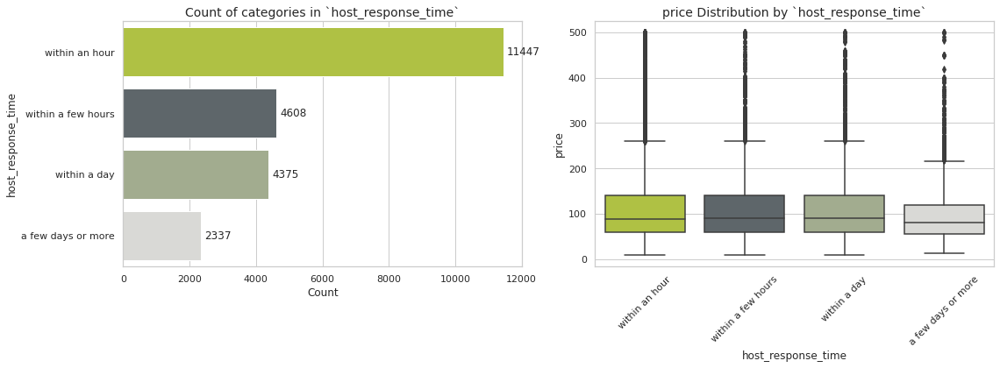

In [0]:
plot_categorical_with_target(df, "host_response_time", "price")

#### Conclusions

- Most Hosts Respond Within an Hour:

  The largest group of hosts reply to guest inquiries within an hour, demonstrating a high level of attentiveness and responsiveness on the platform.

- Fast Response is a Common Standard:

  The second and third bars represent hosts responding within a few hours or a day, showing that a majority of hosts aim to maintain good communication practices.

- Slow Responders Are a Minority:

  Only a small fraction of hosts respond after a few days or more, indicating that long response times are uncommon and may be discouraged by the platform.

- Platform Likely Encourages Quick Replies:

  The dominance of fast response categories suggests Airbnb likely rewards or promotes hosts who maintain strong communication, possibly influencing booking rates.


__`INFO:`__ Due to the high number of missing value and not much difference when compared with target variable we decided to drop this feature. 



In [0]:
cols_to_drop.append('host_response_time')

### 8.6 Property Type

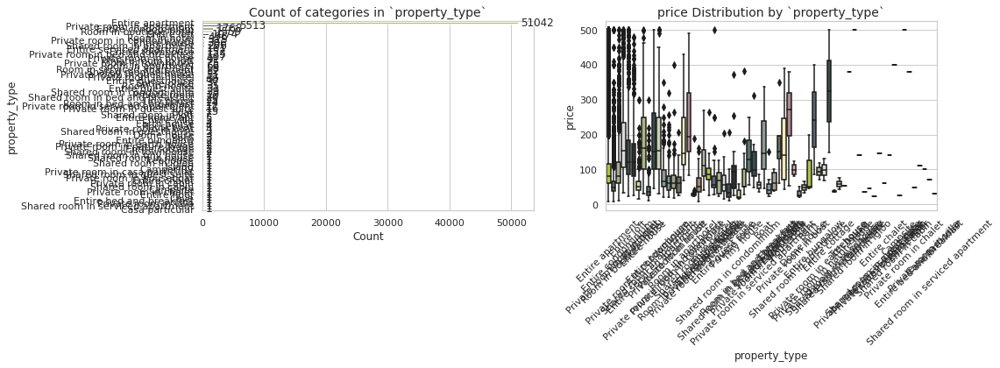

In [0]:
plot_categorical_with_target(df, "property_type", "price")

In [0]:
unique_property_types = (
    df
    .select("property_type")
    .distinct()
    .rdd
    .flatMap(lambda row: row)
    .collect()
)

print("Unique property_type values:")
for pt in unique_property_types:
    print(f"  - {pt}")

Unique property_type values:
  - Entire apartment
  - Private room in loft
  - Shared room in hostel
  - Entire house
  - Shared room in condominium
  - Room in boutique hotel
  - Room in bed and breakfast
  - Entire guesthouse
  - Entire guest suite
  - Entire place
  - Private room in boat
  - Private room in condominium
  - Private room in chalet
  - Cave
  - Room in aparthotel
  - Entire bed and breakfast
  - Private room in guest suite
  - Shared room in serviced apartment
  - Entire townhouse
  - Room in hotel
  - Entire villa
  - Entire home/apt
  - Earth house
  - Private room in bed and breakfast
  - Entire serviced apartment
  - Entire condominium
  - Private room in cabin
  - Private room in serviced apartment
  - Private room in apartment
  - Private room
  - Entire loft
  - Room in serviced apartment
  - Private room in house
  - Tiny house
  - Boat
  - Private room in villa
  - Private room in guesthouse
  - Entire cottage
  - Private room in townhouse
  - Shared room in 

__`INFO:`__ Due to the high number classes, and similarity among them we will group them in fewer classes in the feature engineering section.



### 8.7 Room Type 

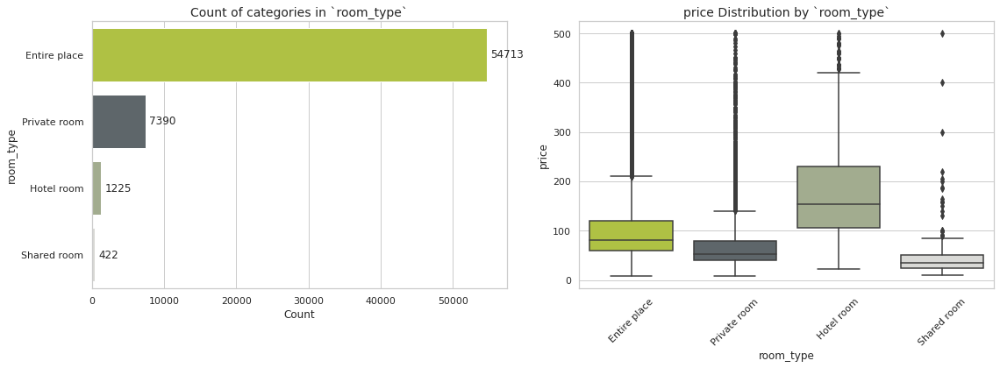

In [0]:
plot_categorical_with_target(df, "room_type", "price")


#### Conclusions

- The majority of listings are for "Entire place" accommodations, which make up the vast majority (over 54,000 listings). This suggests a strong preference or availability for full-property rentals on the platform.

- "Private room" listings are the second most common, followed by a much smaller number of "Hotel room" and "Shared room" listings.

- In terms of price:
  - "Hotel room" listings have the **highest median price**, with a wide price spread and many high-end outliers.
  - "Entire place" listings also tend to have **relatively high prices**, but with a tighter distribution compared to hotel rooms.
  - "Private room" and "Shared room" listings are generally **more affordable**, with lower medians and less variation in price.

- Outliers are present across all categories, especially among "Entire place" and "Hotel room" listings, which may reflect luxury or premium accommodations.

- This distribution suggests that while most users list entire properties, there is still a market for lower-cost alternatives like private or shared rooms.


### 8.8 Neighbourhood

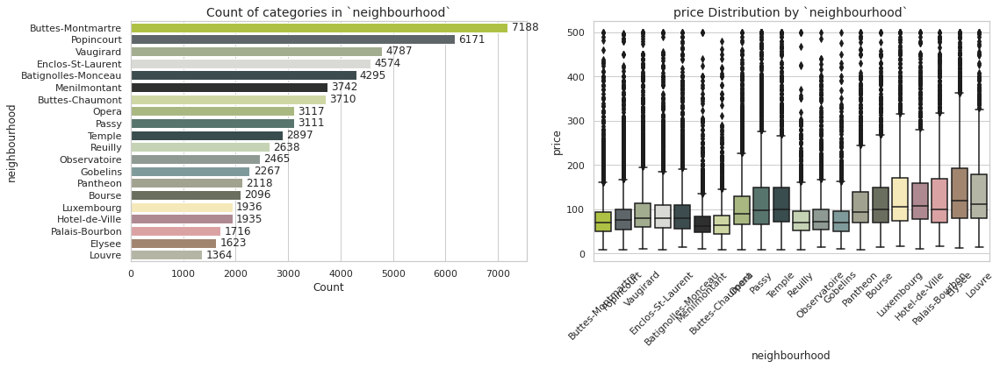

In [0]:
plot_categorical_with_target(df, "neighbourhood", "price")


#### Conclusions

- The most frequently listed neighbourhoods are **Buttes-Montmartre**, **Popincourt**, and **Vaugirard**, each with thousands of listings. These areas likely attract a high volume of tourists or have a dense concentration of rental properties.

- On the other end, **Louvre**, **Elysee**, and **Palais-Bourbon** have the fewest listings, suggesting limited availability or more exclusive rental markets.

- In terms of price distribution:
  - Neighbourhoods like **Louvre**, **Elysee**, and **Palais-Bourbon** have **higher median prices and more expensive outliers**, which may reflect their central location, prestige, or luxury offerings.
  - Areas with higher listing counts (e.g., **Buttes-Montmartre**, **Popincourt**) tend to have **lower median prices**, possibly due to a wider range of property types and more competitive pricing.

- There is a wide range of price variability within almost every neighbourhood, shown by the large number of outliers. This suggests a mix of budget and premium listings in most areas.

- These patterns can inform location-based pricing strategies and indicate which neighbourhoods offer more affordable versus upscale rental options.


### 8.9 Amenities

In [0]:
display(df.select('amenities').limit(10))

amenities
"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]"
"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]"
"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]"
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]"
"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]"
"[""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Hangers"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Dedicated workspace"", ""Cable TV""]"


__`INFO:`__ This feature is going to be engineered to get extract more meaningful informations



## 9. Feature Engineering
### 9.1 Host Years/Days Active 

In [0]:
max_date = (
    df
    .agg(spark_max("host_since").alias("max_date"))
    .first()["max_date"]
)

df = (
    df
    .withColumn(
        "host_days_active",
        datediff(lit(max_date), col("host_since"))
    )
    .withColumn(
        "host_years_active",
        (col("host_days_active") / 365).cast("int")
    )
)

display(df.select("host_since", "host_days_active", "host_years_active"))

host_since,host_days_active,host_years_active
2011-12-03,3354,9
2013-11-29,2627,7
2014-07-31,2383,6
2013-12-17,2609,7
2014-12-14,2247,6
2011-04-13,3588,9
2013-08-09,2739,7
2013-04-14,2856,7
2015-06-14,2065,5
2014-09-02,2350,6


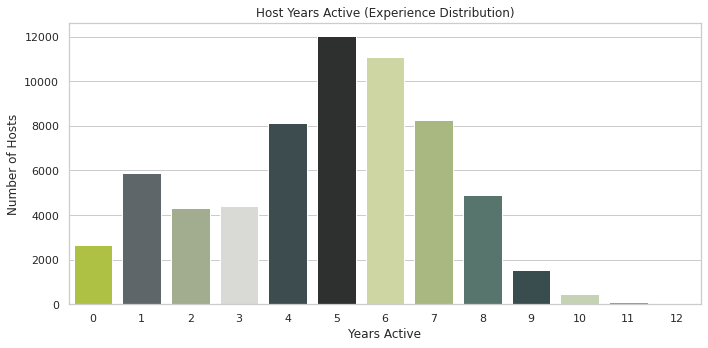

In [0]:
# Filter out invalid values (negative years or nulls)
df_view = df.filter((col("host_years_active") >= 0) & (col("host_years_active").isNotNull()))

# Group and plot
years_active = df_view.groupBy("host_years_active").count().orderBy("host_years_active").toPandas()

# Plot
plt.figure(figsize=(10,5))
sns.barplot(data=years_active, x="host_years_active", y="count", palette=main_palette)
plt.title("Host Years Active (Experience Distribution)")
plt.xlabel("Years Active")
plt.ylabel("Number of Hosts")
plt.tight_layout()
plt.show()

#### Conclusions

- Most Hosts Have Moderate Experience:

  The peak of the distribution lies around 4–6 years of activity, indicating that a large portion of hosts have been on the platform for a sustained but not extreme amount of time.

- New Hosts Are Less Common:

  The number of hosts with only 0–1 year of experience is relatively low, which may reflect barriers to entry, or that the dataset skews toward more established hosts.

- Long-Time Hosts Are a Minority:

  There are fewer hosts with more than 8 years on the platform, suggesting that long-term retention is relatively rare or that Airbnb's major growth came in more recent years.

- Airbnb Has a Mature Host Base:

  The concentration in the middle years indicates a stable core of hosts who are not new but also not among the earliest adopters.

- Platform Evolution Reflected in Host Tenure:

  This distribution may mirror Airbnb’s major growth period, where many hosts joined around the same time and have since remained active.


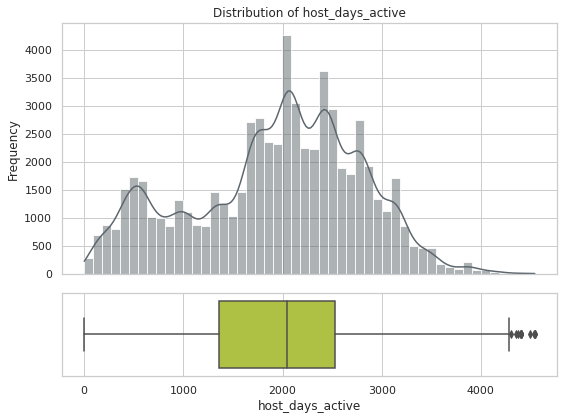

In [0]:
plot_dist_and_box(df, "host_days_active", bins = 50)



#### Conclusions

- The distribution of `host_days_active` is roughly symmetrical and **centered around 2000 days**, indicating that many hosts have been active for around 5–6 years.

- There is a **broad spread** of host activity, with a notable density between 1000 and 3000 days, suggesting a stable base of long-term hosts on the platform.

- A few **outliers exist beyond 4000 days**, possibly indicating early adopters or data inconsistencies (since that’s over 10 years).

- The distribution suggests a **mature host population**, with relatively few very new or extremely old accounts.

- The long right tail and minor clustering may reflect growth phases of the platform or varying host entry times.


In [0]:
numeric_cols.append('host_days_active')
numeric_cols.append('host_years_active')


### 9.2 Property Type New Groups

- Next we group these property types in categories. These categories will be "entire_place", "private_room", "shared_room", "unique_stays" and "hotel_boutique".<br>

| Category                       | Description |
|------------------------------|-------------|
| `entire_place`                 | Includes all listings that are an entire place and not just a room. |
| `private_room`                       | Includes all listings that are a unique private room. |
| `shared_room`                    | Includes all listings that are a shared room. |
| `unique_stays`                 | Includes out of the box listings (for example: cave, RV, etc) |
| `hotel`              | Includes listings that are hotels.  |

- Special attention to a property type that is written in portuguese. "Casa particular" which means Private House and will be included in the "entire_place".

In [0]:
property_type_groups = {
    "entire_place": [
        "Entire apartment",
        "Entire house",
        "Entire guesthouse",
        "Entire guest suite",
        "Entire place",
        "Entire bed and breakfast",
        "Entire townhouse",
        "Entire villa",
        "Entire home/apt",
        "Entire serviced apartment",
        "Entire condominium",
        "Entire loft",
        "Entire cottage",
        "Entire bungalow",
        "Entire floor",
        "Entire chalet",
        "Casa particular"
    ],
    "private_room": [
        "Private room in loft",
        "Private room in boat",
        "Private room in condominium",
        "Private room in chalet",
        "Private room in guest suite",
        "Private room in bed and breakfast",
        "Private room in cabin",
        "Private room in serviced apartment",
        "Private room in apartment",
        "Private room",
        "Private room in house",
        "Private room in villa",
        "Private room in guesthouse",
        "Private room in townhouse",
        "Private room in earth house",
        "Private room in hostel",
        "Private room in casa particular",
        "Private room in nature lodge",
        "Private room in houseboat",
        "Room in serviced apartment",
        "Room in bed and breakfast"
    ],
    "shared_room": [
        "Shared room in hostel",
        "Shared room in condominium",
        "Shared room in serviced apartment",
        "Shared room in apartment",
        "Shared room in cabin",
        "Shared room in loft",
        "Shared room in bed and breakfast",
        "Shared room in tiny house",
        "Shared room in house",
        "Shared room in igloo",
        "Shared room in guest suite",
        "Shared room in guesthouse",
        "Shared room in townhouse"
    ],
    "unique_stays": [
        "Cave",
        "Tiny house",
        "Boat",
        "Earth house",
        "Campsite",
        "Houseboat",
        "Dome house",
        "Camper/RV",
        "Treehouse",
        "Island",
        "Barn"
    ],
    "hotel": [
        "Room in boutique hotel",
        "Room in aparthotel",
        "Room in hotel",
        "Room in hostel"
    ]
}


- Next we replace the property type by their category.

In [0]:
# Invert the dictionary for easy lookup
mapping = {}
for category, types in property_type_groups.items():
    for t in types:
        mapping[t] = category

# Define the UDF that maps a property type to its category
def map_to_category(ptype):
    return mapping.get(ptype, "Other")  # default "Other" if no match found

map_udf = udf(map_to_category, StringType())

# to replace the original column
df = df.withColumn("property_type", map_udf(col("property_type")))

display(df)

host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,host_days_active,host_years_active
1466919,281420,"Beautiful Flat in le Village Montmartre, Paris",2011-12-03,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Buttes-Montmartre,null,Paris,48.88668,2.33343,entire_place,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,0,3354,9
10328771,3705183,39 mÂ² Paris (Sacre CÅ“ur),2013-11-29,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Montmartre,null,Paris,48.88617,2.34515,entire_place,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,0,2627,7
19252768,4082273,"Lovely apartment with Terrace, 60m2",2014-07-31,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Elysee,null,Paris,48.88112,2.31712,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,0,2383,6
10668311,4797344,Cosy studio (close to Eiffel tower),2013-12-17,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Vaugirard,null,Paris,48.84571,2.30584,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,0,2609,7
24837558,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,2014-12-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Passy,null,Paris,48.855,2.26979,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,0,2247,6
505535,4898654,NEW - Charming apartment Le Marais,2011-04-13,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Temple,null,Paris,48.86428,2.3537,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Cable TV""]",95,2,1125,100,10,10,10,10,10,10,0,3588,9
8053690,6021700,2P - Entre Bastille et Republique,2013-08-09,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Popincourt,null,Paris,48.86384,2.37101,entire_place,Entire place,2,1,"[""Shampoo"", ""TV"", ""Kitchen"", ""Washer"", ""Smoke alarm"", ""Wifi"", ""Fire extinguisher"", ""Long term stays allowed""]",80,2,1125,100,10,10,10,10,10,10,0,2739,7
5924709,6945740,57sqm btw. Bastille & PÃ¨re Lachaise,2013-04-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Popincourt,null,Paris,48.86043,2.37842,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed""]",59,2,1125,100,10,10,10,10,10,10,0,2856,7
35812762,7491966,Charming appartment near the Parc Buttes Chaumont,2015-06-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Chaumont,null,Paris,48.87871,2.37489,entire_place,Entire place,2,1,"[""Paid parking off premises"", ""Shampoo"", ""Heating"", ""TV"", ""Iron"", ""Kitchen"", ""Hair dryer"", ""Essentials"", ""Washer"", ""Hot water"", ""Hangers"", ""Smoke alarm"", ""Wifi"", ""Long term stays allowed"", ""Dedicated workspace"", ""Host greets you"", ""Cable TV""]",80,2,1125,100,10,10,10,10,10,10,0,2065,5
20833291,7849932,Bel appartement plein de charme !,2014-09-02,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Opera,null,Paris,48.8779,2.33122,entire_plac

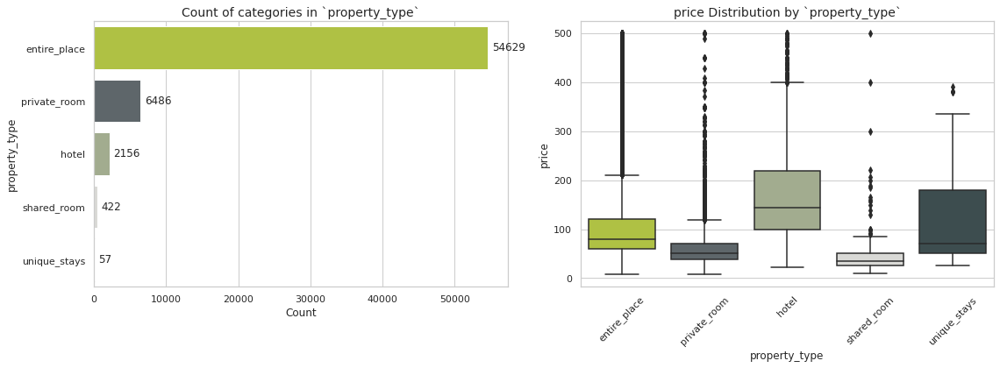

In [0]:
plot_categorical_with_target(df, "property_type", "price")


#### Conclusions

- The vast majority of listings are for `entire_place` properties, accounting for over 54,000 entries. This indicates that most hosts offer full-property rentals.

- `private_room` is the second most common type, followed by smaller counts for `hotel`, `shared_room`, and very few `unique_stays`.

- In terms of price distribution:
  - `hotel` listings tend to have the **highest median prices** and a wide range, suggesting they target higher-end or centrally located travelers.
  - `entire_place` properties have relatively high prices but are more consistently distributed.
  - `shared_room` and `private_room` are the **most affordable** options, with lower medians and tighter price ranges.
  - `unique_stays` show high variability, with some listings priced very high, possibly due to niche or luxury offerings.

- Outliers are frequent across all categories, particularly in `hotel`, `entire_place`, and `unique_stays`, which may reflect luxury listings or inflated prices in certain areas.

- This distribution illustrates a diverse market with dominant full-property rentals and distinct pricing tiers across property types.


In [0]:
unique_property_types = (
    df
    .select("property_type")
    .distinct()
    .rdd
    .flatMap(lambda row: row)
    .collect()
)

print("Unique property_type values:")
for pt in unique_property_types:
    print(f"  - {pt}")

Unique property_type values:
  - entire_place
  - hotel
  - private_room
  - shared_room
  - unique_stays


- We went from 66 different property types to 5. <br>
- In general hotel listings are more expensive, these makes sense due to extra services like housekeeping, breakfast, frontdesk services 24/7, gym, etc etc. <br>
- The majority of the listings (84%) are entire place listings. This indicates there is a strong market for renting entire properties in Paris. <br>
- As expected the least common property type is unique type (0.09%) 


### 9.3 Amenities Length

In [0]:
# 1) Parse the string as a JSON array of strings
df = df.withColumn(
    "amenities_array",
    from_json(col("amenities"), ArrayType(StringType()))
)

# 2) Create "amenities_length" as the size of that array
df = df.withColumn(
    "amenities_length",
    size(col("amenities_array"))
)

# Verify
display(df.select("amenities",'amenities_array' ,"amenities_length").limit(5))

amenities,amenities_array,amenities_length
"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]","List(Heating, Kitchen, Washer, Wifi, Long term stays allowed)",5
"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]","List(Shampoo, Heating, Kitchen, Essentials, Washer, Dryer, Wifi, Long term stays allowed)",8
"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]","List(Heating, TV, Kitchen, Washer, Wifi, Long term stays allowed)",6
"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]","List(Heating, TV, Kitchen, Wifi, Long term stays allowed)",5
"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]","List(Heating, TV, Kitchen, Essentials, Hair dryer, Washer, Dryer, Bathtub, Wifi, Elevator, Long term stays allowed, Cable TV)",12


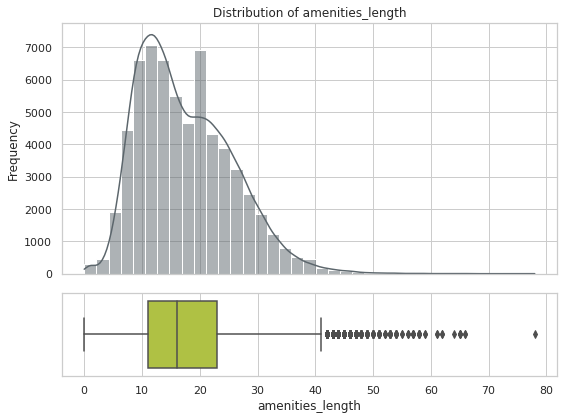

In [0]:
plot_dist_and_box(df, 'amenities_length', bins = 37)

#### Conclusions

- Most Listings Offer 10 to 25 Amenities:

  The distribution peaks between 10 and 25 amenities, indicating that this is the typical range of offerings for Airbnb listings.

- Very Sparse Listings Are Uncommon:

  Only a small number of listings provide fewer than 5 amenities, suggesting that even basic listings include several comfort or convenience features.

- Long Tail Toward High-Amenity Listings:

  A minority of listings offer 40 or more amenities, possibly indicating luxury units, full-service apartments, or professional hosts.

- Amenity Count Reflects Competitive Hosting:

  The spread of amenities suggests hosts aim to enhance their listings with as many features as possible to stay competitive and increase guest satisfaction.

- Opportunity for Listing Differentiation:

  Hosts with lower amenity counts may benefit from improving their offering, as most listings fall within a mid-to-high amenity range.


In [0]:
numeric_cols.append('amenities_length')


### 9.4 Amenities Engineering

In [0]:
exploded_df = df.select(explode("amenities_array").alias("amenity"))

unique_amenities = exploded_df.select("amenity").distinct()

amenity_list = [row['amenity'] for row in unique_amenities.collect()]
count = len(amenity_list)
print(f"Total number of amenities: {count}")

Total number of amenities: 618


- There are 618 different amenities.
- Having a quick look we can see that there are different words or group of words to say the same (for example: 'De Dietrich stainless steel oven', 'MIELE oven' that are referring to just oven)

#### Airbnb Amenities Processing Pipeline

1. **Standardize amenities using a controlled keyword list**

   * Replace verbose or branded terms (e.g., `"de dietrich stainless steel oven"`)
   * Keep only simplified, meaningful keywords (e.g., `"oven"`)
   * Filter out non-relevant or redundant tokens

2. **Normalize the `amenities` column**

   * Convert all text to lowercase
   * Remove special characters, punctuation, and extra spaces
   * Ensure consistent formatting across listings

3. **Group standardized keywords into amenity categories**

   * Create a dictionary mapping categories (e.g., `"kitchen"`, `"safety"`, `"baby-friendly"`)
   * Each category contains a curated list of associated amenities

4. **Enrich the DataFrame with category-based feature columns**

   * For each listing, calculate the proportion of amenities it has in each category:
     `(# matched amenities in category) / (total amenities in category)`
   * Add one column per category with these proportions

In [0]:
keywords = ['kettle', 'dedicated workspace table', 'indoor fireplace', 'coffee machine', 'first aid kit', 'stove', 'washerin unit', 'kitchen', 'single level home', 'sound system', 'clothing storage', 'refrigerator', 'garden', 'oven', 'hdtv', 'netflix', 'smoking allowed', 'tv', 'body soap', 'outdoor furniture', 'crib','coffee', 'movie projector', 'babysitter recommendations','host greets you','baby safety gates','pool table', 'air conditioning','parking', 'outlet covers','heating','window guards','waterfront','lake access','bedroom comforts','shampoo','washer','fireplace guards','baby monitor','conditioner','ac unit','extra pillows and blankets','childrens dinnerware','hot water','iron','dryer','childrens books and toys','wifi','game console','barbecue','washer','shower gel','breakfast','baking sheet','cleaning before checkout','patio', 'balcony','pool','self checkin','lockbox','sauna','keypad','hangers','drying rack for clothing','fans','wine glasses','private entrance','dryerin','bathtub','dishes and silverware','microwave','outdoor shower','heater','high chair','safe','beachfront','smoke alarm','pets allowed','fan','ethernet','dining table','dedicated workspace','elevator','laundromat','gym','table corner guards','toaster','cleaning products','hot tub','nespresso machine','ev charger','smart lock','record player','fridge','outdoor dining area','rice maker','essentials','luggage dropoff allowed','carbon monoxide alarm','long term stays allowed','bathroom essentials','dishwasher','freezer','bidet','skiinskiout','building staff','washer in','roomdarkening shades','mosquito net','fire extinguisher','beach essentials','garden or backyard','changing table','cooking basics','piano','bed linens','bbq grill','baby bath','bread maker','childrens books and toys','eletric blinds','rain shower','bikes','wine cellar','gated pproperty','wine cooler','ice machine','board games','suitable for events','decorative fireplace','trash compactor','espresso machine','balcony','dryer in','dual vanity','wet bar','private living room','library','massage bed','office','music system','dvd player','outdoor seating','internet','patio','gated community','video games','sun loungers','spa','ipod dock','game room','steam room','projector','dining area','books','ironing board','lounge area','blender','restaurant','gas grill','smoking parlor','terrace','woodburning fireplace','bluray player','lock on bedroom door','ping pong table','garage','ipad','room service','housekeeping','toiletries','bathrobes','bikes','bed sheets and pillows','selfparking','alarm system','airport shuttle','fitness center','minibar','bar','laundry services','courtyard','concierge','slippers','hammam','bluetooth speaker','printer','turndown service','bottled water','linens','desk','kitchenette','washer','security cameras']

- Next we normalize the amenities to this keywords and insert them in a new columns named "standardized_amenities".

In [0]:
# Step 1: Normalize keywords
normalized_keywords = list(set([
    re.sub(r'[^a-zA-Z\s]', '', kw.lower()).strip()
    for kw in keywords
]))
keyword_set = set(normalized_keywords)

# Step 2: Define the UDF
def map_amenities_to_keywords(amenities):
    if not amenities:
        return []
    
    cleaned = []
    for amenity in amenities:
        normalized = re.sub(r'[^a-zA-Z\s]', '', amenity.lower()).strip()
        for kw in keyword_set:
            if kw in normalized:
                cleaned.append(kw)
                break
    return list(set(cleaned))  # Remove duplicates

map_udf = udf(map_amenities_to_keywords, ArrayType(StringType()))

# Step 3: Parse JSON if needed (only if amenities is a JSON string)
schema = ArrayType(StringType())
df = df.withColumn("amenities_array", from_json(col("amenities"), schema))

# Step 4: Add the cleaned standardized amenities column
df = df.withColumn("standardized_amenities", map_udf(col("amenities_array")))


- Creation of a dictionary of amenity categories and correspondent amenities belonging to those categories.

In [0]:
amenity_categories = {
    "living_entertainment": [
        "tv", "hdtv", "netflix", "sound system", "movie projector", "record player",
        "dvd player", "bluray player", "ipod dock", "music system", "books",
        "board games", "game console", "video games", "ping pong table",
        "game room", "lounge area", "projector"
    ],
    "kitchen_dining": [
        "kitchen", "microwave", "oven", "stove", "toaster", "fridge", "refrigerator",
        "freezer", "rice maker", "bread maker", "nespresso machine", "coffee machine",
        "espresso machine", "kettle", "cooking basics", "dishes and silverware",
        "baking sheet", "blender", "dining table", "dining area", "wine glasses",
        "wine cooler", "wine cellar", "gas grill", "bbq grill", "barbecue", "dishwasher",
        "kitchenette", "ice machine"
    ],
    "bedroom": [
        "bed linens", "bedroom comforts", "bed sheets and pillows", "clothing storage",
        "extra pillows and blankets", "hangers", "ironing board", "iron",
        "roomdarkening shades", "linens", "alarm system"
    ],
    "bathroom": [
        "body soap", "shampoo", "conditioner", "shower gel", "bathtub", "bidet",
        "hot water", "bathroom essentials", "toiletries", "dual vanity", "rain shower",
        "bathrobes"
    ],
    "baby_family": [
        "crib", "high chair", "baby bath", "baby monitor", "baby safety gates",
        "childrens books and toys", "childrens dinnerware", "changing table",
        "table corner guards"
    ],
    "laundry_cleaning": [
        "washer", "washerin unit", "washer in", "dryer", "dryerin",
        "drying rack for clothing", "laundromat", "cleaning products",
        "cleaning before checkout", "laundry services"
    ],
    "safety_security": [
        "smoke alarm", "carbon monoxide alarm", "fire extinguisher",
        "fireplace guards", "outlet covers", "window guards", "mosquito net",
        "security cameras", "smart lock", "lockbox", "keypad",
        "lock on bedroom door", "alarm system"
    ],
    "outdoor_garden": [
        "patio", "balcony", "terrace", "garden", "garden or backyard",
        "outdoor furniture", "outdoor dining area", "outdoor seating",
        "outdoor shower", "sun loungers", "beachfront", "lake access",
        "beach essentials", "bikes", "gated community", "gated pproperty", "hammock"
    ],
    "heating_cooling": [
        "air conditioning", "ac unit", "fan", "fans", "heater", "heating",
        "indoor fireplace", "woodburning fireplace", "decorative fireplace"
    ],
    "travel_access": [
        "self checkin", "luggage dropoff allowed", "long term stays allowed",
        "private entrance", "suitable for events", "garage", "parking",
        "selfparking", "airport shuttle"
    ],
    "wellness_leisure": [
        "pool", "sauna", "hot tub", "hammam", "massage bed", "spa", "steam room"
    ],
    "workspace_tech": [
        "dedicated workspace", "dedicated workspace table", "desk", "office",
        "ethernet", "printer", "ipad", "internet", "wifi"
    ],
    "guest_services": [
        "host greets you", "room service", "housekeeping", "turndown service",
        "concierge", "minibar", "bar", "restaurant", "bottled water", "slippers",
        "building staff", "books", "library", "courtyard"
    ],
    "misc_essentials": [
        "essentials", "first aid kit", "pets allowed", "outlet covers"
    ]
}

- Enrich the DataFrame with category-based feature columns.

In [0]:
# Existing category dictionary
amenity_categories_broadcast = sc.broadcast(amenity_categories)

for category, keywords in amenity_categories.items():
    category_col = f"{category}"
    df = df.withColumn(
        category_col,
        size(array_intersect(col("standardized_amenities"), 
                             array([lit(k) for k in keywords])))
        )


In [0]:
display(df.limit(5))

host_id,listing_id,name,host_since,host_location,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,district,city,latitude,longitude,property_type,room_type,accommodates,bedrooms,amenities,price,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,instant_bookable,host_days_active,host_years_active,amenities_array,amenities_length,standardized_amenities,living_entertainment,kitchen_dining,bedroom,bathroom,baby_family,laundry_cleaning,safety_security,outdoor_garden,heating_cooling,travel_access,wellness_leisure,workspace_tech,guest_services,misc_essentials
1466919,281420,"Beautiful Flat in le Village Montmartre, Paris",2011-12-03,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Buttes-Montmartre,null,Paris,48.88668,2.33343,entire_place,Entire place,2,1,"[""Heating"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",53,2,1125,100,10,10,10,10,10,10,0,3354,9,"List(Heating, Kitchen, Washer, Wifi, Long term stays allowed)",5,"List(washer, wifi, heating, long term stays allowed, kitchen)",0,1,0,0,0,1,0,0,1,1,0,1,0,0
10328771,3705183,39 mÂ² Paris (Sacre CÅ“ur),2013-11-29,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Buttes-Montmartre,null,Paris,48.88617,2.34515,entire_place,Entire place,2,1,"[""Shampoo"", ""Heating"", ""Kitchen"", ""Essentials"", ""Washer"", ""Dryer"", ""Wifi"", ""Long term stays allowed""]",120,2,1125,100,10,10,10,10,10,10,0,2627,7,"List(Shampoo, Heating, Kitchen, Essentials, Washer, Dryer, Wifi, Long term stays allowed)",8,"List(washer, wifi, heating, shampoo, essentials, long term stays allowed, dryer, kitchen)",0,1,0,1,0,2,0,0,1,1,0,1,0,1
19252768,4082273,"Lovely apartment with Terrace, 60m2",2014-07-31,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Elysee,null,Paris,48.88112,2.31712,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Washer"", ""Wifi"", ""Long term stays allowed""]",89,2,1125,100,10,10,10,10,10,10,0,2383,6,"List(Heating, TV, Kitchen, Washer, Wifi, Long term stays allowed)",6,"List(washer, wifi, heating, tv, long term stays allowed, kitchen)",1,1,0,0,0,1,0,0,1,1,0,1,0,0
10668311,4797344,Cosy studio (close to Eiffel tower),2013-12-17,"Paris, Ile-de-France, France",null,null,null,0,1,1,1,Vaugirard,null,Paris,48.84571,2.30584,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Wifi"", ""Long term stays allowed""]",58,2,1125,100,10,10,10,10,10,10,0,2609,7,"List(Heating, TV, Kitchen, Wifi, Long term stays allowed)",5,"List(wifi, heating, tv, long term stays allowed, kitchen)",1,1,0,0,0,0,0,0,1,1,0,1,0,0
24837558,4823489,Close to Eiffel Tower - Beautiful flat : 2 rooms,2014-12-14,"Paris, Ile-de-France, France",null,null,null,0,1,1,0,Passy,null,Paris,48.855,2.26979,entire_place,Entire place,2,1,"[""Heating"", ""TV"", ""Kitchen"", ""Essentials"", ""Hair dryer"", ""Washer"", ""Dryer"", ""Bathtub"", ""Wifi"", ""Elevator"", ""Long term stays allowed"", ""Cable TV""]",60,2,1125,100,10,10,10,10,10,10,0,2247,6,"List(Heating, TV, Kitchen, Essentials, Hair dryer, Washer, Dryer, Bathtub, Wifi, Elevator, Long term stays allowed, Cable TV)",12,"List(washer, wifi, elevator, heating, essentials, tv, long term stays allowed, dryer, bathtub, kitchen)",1,1,0,1,0,2,0,0,1,1,0,1,0,1



__`INFO:`__ Dropping raw features

In [0]:
cols_to_drop.extend(['amenities', 'amenities_array', 'standardized_amenities'])

In [0]:
numeric_cols.extend([
    "living_entertainment",
    "kitchen_dining",
    "bedroom",
    "bathroom",
    "baby_family",
    "laundry_cleaning",
    "safety_security",
    "outdoor_garden",
    "heating_cooling",
    "travel_access",
    "wellness_leisure",
    "guest_services",
    "misc_essentials"
])

numeric_cols = [c for c in numeric_cols if c not in cols_to_drop]
categorical_cols = [c for c in categorical_cols if c not in cols_to_drop]
binary_cols = [c for c in binary_cols if c not in cols_to_drop]


# DROPING COLUMNS 

In [0]:
df_cleaned = (
    df
    .drop(*cols_to_drop)    
)



__`INFO:`__:  Saving cleaned df into a .csv




In [0]:
(
    df_cleaned
    .coalesce(1)                 
    .write
    .option("header", "true")
    .mode("overwrite")
    .csv("dbfs:/FileStore/tables/Listings_cleaned")
)




__`INFO:`__: Sanity checking if it was saved




In [0]:
df_check = (
    spark.read
         .option("header", "true")
         .csv("dbfs:/FileStore/tables/Listings_cleaned")
)
display(df_check.limit(5))
df_shape(df)

host_is_superhost,host_total_listings_count,host_has_profile_pic,host_identity_verified,neighbourhood,property_type,room_type,accommodates,bedrooms,price,minimum_nights,review_scores_rating,instant_bookable,host_days_active,host_years_active,amenities_length,living_entertainment,kitchen_dining,bedroom,bathroom,baby_family,laundry_cleaning,safety_security,outdoor_garden,heating_cooling,travel_access,wellness_leisure,workspace_tech,guest_services,misc_essentials
0,1,1,0,Buttes-Montmartre,entire_place,Entire place,2,1,53,2,100,0,3354,9,5,0,1,0,0,0,1,0,0,1,1,0,1,0,0
0,1,1,1,Buttes-Montmartre,entire_place,Entire place,2,1,120,2,100,0,2627,7,8,0,1,0,1,0,2,0,0,1,1,0,1,0,1
0,1,1,0,Elysee,entire_place,Entire place,2,1,89,2,100,0,2383,6,6,1,1,0,0,0,1,0,0,1,1,0,1,0,0
0,1,1,1,Vaugirard,entire_place,Entire place,2,1,58,2,100,0,2609,7,5,1,1,0,0,0,0,0,0,1,1,0,1,0,0
0,1,1,0,Passy,entire_place,Entire place,2,1,60,2,100,0,2247,6,12,1,1,0,1,0,2,0,0,1,1,0,1,0,1


63750 rows × 52 columns


### Bi-variate Analysis and Multi-variate Analysis (WIP)

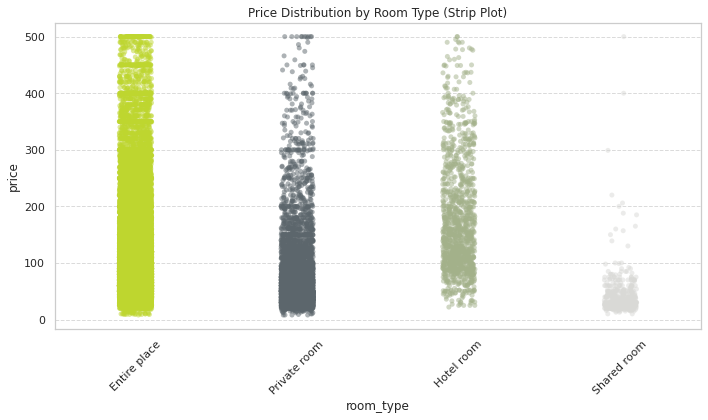

In [0]:
# Convert Spark DataFrame to Pandas
data = df.select("room_type", "price").dropna().toPandas()

# Plot
plt.figure(figsize=(10, 6))
sns.stripplot(data=data, x="room_type", y="price", alpha=0.5, jitter=True, palette=main_palette)
plt.title("Price Distribution by Room Type (Strip Plot)")
plt.xticks(rotation=45)
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

#### Conclusions

- Entire Places Have the Widest Price Range:

  Listings labeled as "Entire place" show the broadest spread of prices, including the most extreme outliers.

- Private and Hotel Rooms Are Moderately Priced:

  "Private room" and "Hotel room" listings cluster mostly under $1000, with fewer extreme values, indicating they serve mid-range market needs.

- Shared Rooms Are the Least Expensive:

  "Shared room" listings consistently fall in the lower price ranges, reflecting their budget-oriented nature and minimal privacy.

- Clear Price Differentiation by Room Type:

  The plot highlights distinct price bands for each room type, showing how accommodation type strongly influences nightly cost.

- Presence of Outliers in All Categories:

  Every room type contains some high-priced outliers, but they are most prominent in "Entire place" listings, suggesting luxury or unique properties.


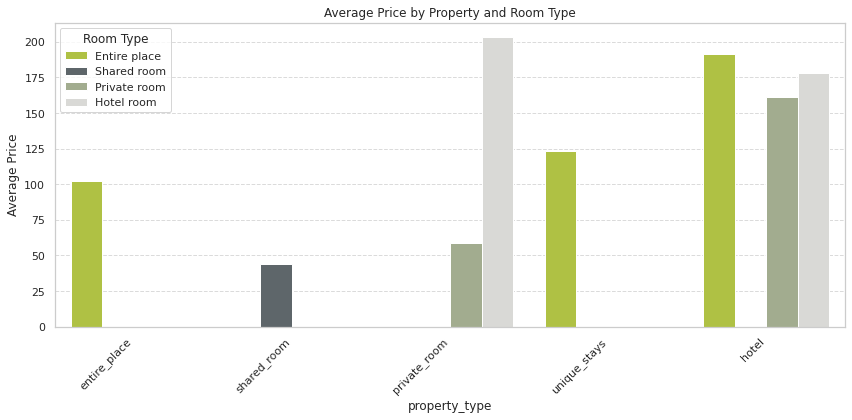

In [0]:
# Group in Spark and calculate average price
grouped_spark = df.groupBy("property_type", "room_type").agg(F.mean("price").alias("price"))

# Convert result to Pandas
grouped = grouped_spark.toPandas()

# Plot
plt.figure(figsize=(12, 6))
sns.barplot(data=grouped, x="property_type", y="price", hue="room_type", palette=main_palette)
plt.title("Average Price by Property and Room Type")
plt.xticks(rotation=45, ha='right')
plt.ylabel("Average Price")
plt.grid(True, axis='y', linestyle='--', alpha=0.7)
plt.legend(title="Room Type")
plt.tight_layout()
plt.show()


#### Conclusions

- **Hotel rooms** have the highest average price overall, particularly when categorized under `hotel` property type, exceeding \$200 on average.

- **Unique stays** and **entire place** listings also command high average prices, especially under the `entire_place` and `unique_stays` property types, often exceeding \$120–\$190.

- **Shared rooms** consistently have the lowest average prices across all property types, reflecting their budget-friendly nature.

- For the `private_room` category, average prices vary depending on the property type, but they remain lower than hotel or unique accommodations.

- These trends highlight a clear pricing hierarchy:  
  `hotel room` > `entire place` > `unique stays` > `private room` > `shared room`.

- This segmentation can inform user targeting, marketing strategies, or pricing benchmarks based on accommodation type and experience offered.


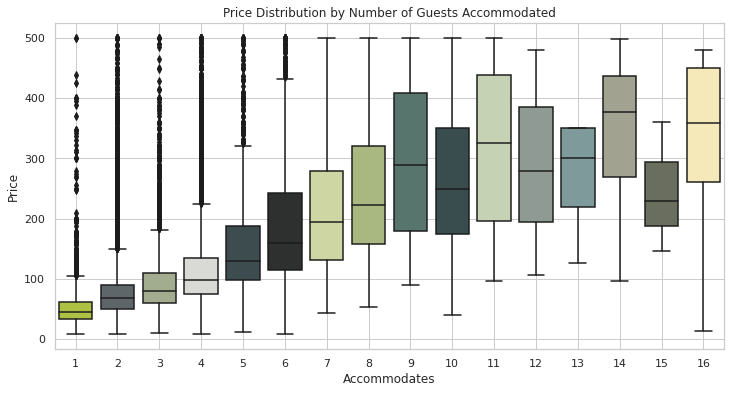

In [0]:
data = df.select("accommodates", "price").dropna().toPandas()

plt.figure(figsize=(12, 6))
sns.boxplot(data=data, x="accommodates", y="price", palette=main_palette)
plt.title("Price Distribution by Number of Guests Accommodated")
plt.xlabel("Accommodates")
plt.ylabel("Price")
plt.grid(True)
plt.show()


#### Conclusions

- There is a **clear positive correlation** between the number of guests a listing can accommodate and its price. As capacity increases, so does the median price.

- Listings for **1–2 guests** tend to be the most affordable, with medians below \$100 and relatively tight price distributions.

- Starting from around **5 guests**, both the median price and the spread increase significantly, reflecting the added value of larger spaces or amenities.

- Listings that accommodate **10+ guests** show high price variability, with wider interquartile ranges and more frequent high-price outliers, likely due to luxury or group-oriented properties.

- Some price overlap exists across all ranges, meaning that some large accommodations are priced similarly to small ones—possibly due to location, quality, or host strategy.

- Overall, price tends to scale with guest capacity, which is intuitive and useful for forecasting, pricing models, and customer segmentation.


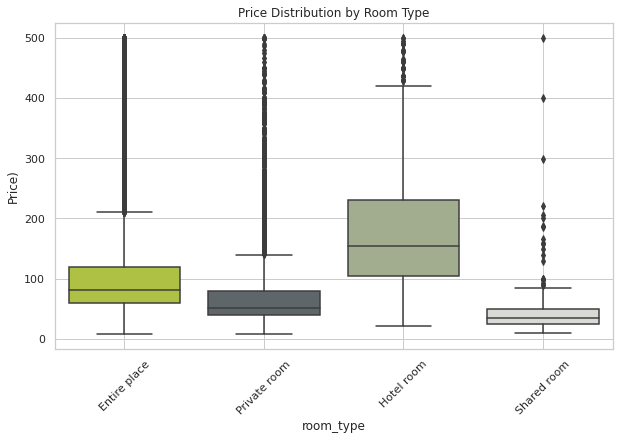

In [0]:
data = df.dropna(subset=["room_type", "price"]).toPandas()

plt.figure(figsize=(10, 6))
sns.boxplot(data=data, x="room_type", y="price", palette=main_palette)
plt.title("Price Distribution by Room Type")
plt.xticks(rotation=45)
plt.grid(True)
plt.ylabel("Price)")
plt.show()


#### Conclusions

- **Hotel rooms** exhibit the **highest median price** and the widest price distribution among all room types, reflecting a premium pricing tier and more luxury-oriented accommodations.

- **Entire place** listings also show relatively high prices but with a narrower interquartile range compared to hotel rooms, suggesting more pricing consistency for full-property rentals.

- **Private rooms** offer a **moderate-priced alternative**, with a lower median price and fewer extreme outliers, indicating affordability with some price variation.

- **Shared rooms** are the **most affordable option**, having the lowest median and the tightest spread, but also a few outliers that may reflect niche or high-demand locations.

- Overall, price levels follow an intuitive hierarchy:
  `Shared room` < `Private room` < `Entire place` < `Hotel room`.

- The presence of many outliers across categories—especially for `hotel room` and `entire place`—suggests a broad range of listing quality, size, or location even within each room type.


# Pairwise Analysis

##### Numeric Features Analysis

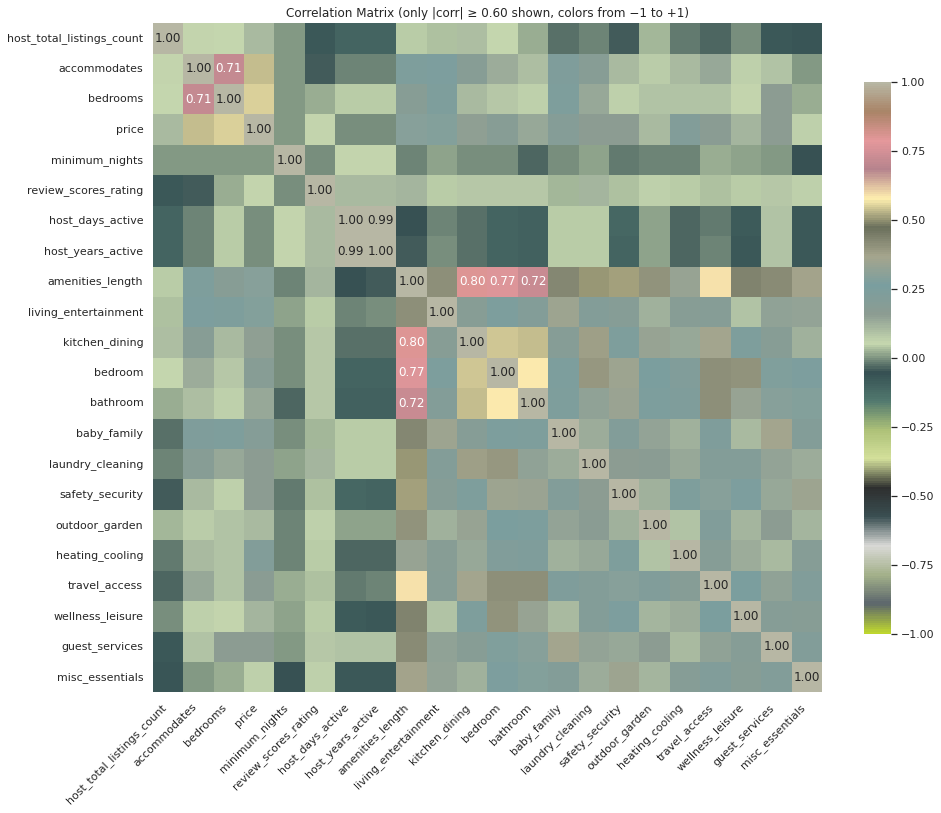

In [0]:
# Create custom colormap from palette
custom_cmap = LinearSegmentedColormap.from_list("custom_main", main_palette, N=256)

# Set the palette globally for seaborn
sns.set_palette(main_palette)


# Drop rows with nulls in numeric columns
df_numeric = df.select(numeric_cols).dropna()

# Assemble features into a vector column
assembler = VectorAssembler(inputCols=numeric_cols, outputCol="features")
df_vector = assembler.transform(df_numeric).select("features")

# Compute Pearson correlation matrix
corr_matrix = Correlation.corr(df_vector, "features", "pearson").head()[0]

# Convert to NumPy array → Pandas DataFrame
corr_array = corr_matrix.toArray()
corr_df = pd.DataFrame(corr_array, index=numeric_cols, columns=numeric_cols)

# Build an "annot" DataFrame: show only |corr| ≥ 0.60, else blank
annot_df = corr_df.copy().applymap(lambda x: f"{x:.2f}" if abs(x) >= 0.60 else "")

# Plot heatmap with fixed vmin/vmax using custom color map
plt.figure(figsize=(14, 12))
sns.heatmap(
    corr_df,
    annot=annot_df,
    cmap=custom_cmap,      
    fmt="",                
    vmin=-1,
    vmax=1,
    square=True,
    cbar_kws={"shrink": 0.75}
)
plt.title("Correlation Matrix (only |corr| ≥ 0.60 shown, colors from −1 to +1)")
plt.xticks(rotation=45, ha="right")
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()






#### Conclusions

The matrix highlights linear relationships between numeric features. Only correlations with an absolute value ≥ 0.60 are shown, indicating moderate to strong linear dependencies.

##### Strong Positive Correlations

- **`accommodates` and `bedrooms` (r = 0.71)**
  - Logical relationship: more bedrooms generally imply higher accommodation capacity.
  
- **`host_days_active` and `host_years_active` (r = 0.99)**
  - Indicates these are near-duplicates or represent the same underlying concept. One may be dropped.

- **`kitchen_dining`, `bedroom`, and `bathroom` with `amenities_length` (r = 0.72–0.80)**
  - Listings with more kitchen, bedroom, and bathroom amenities tend to have longer amenities lists overall.
  - These variables are tightly related and might be candidates for dimensionality reduction.

- **`kitchen_dining` and `bedroom` (r = 0.80)**
  - These may often scale together in higher-capacity or full-home listings.

- **`bedroom` and `bathroom` (r = 0.77)**
  - Indicates a design or accommodation pattern where more bedrooms are matched with more bathrooms.



##### Moderate Correlations

- Several relationships fall between r = 0.60 and 0.70, especially among property structure and amenity variables. These suggest collinearity between features representing property scale or quality.




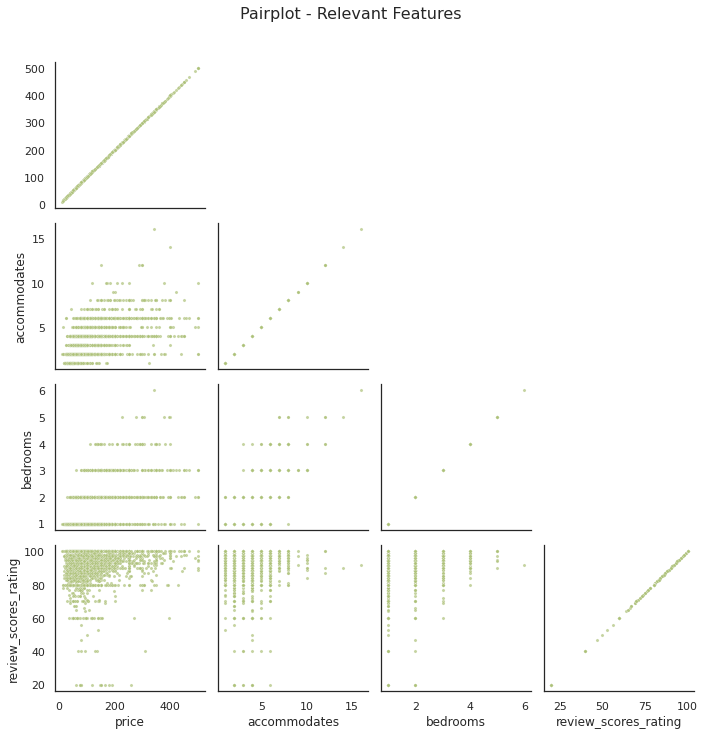

In [0]:
# Relevant features
relevant_features = ['price', 'accommodates', 'bedrooms', 'review_scores_rating']

# Sample and convert to pandas
df_sampled = df_numeric.sample(fraction=0.1, seed=42).toPandas()[relevant_features]

# Plot pairplot 
sns.set(style="white")
sns.pairplot(
    df_sampled,
    kind="scatter",
    corner=True,
    diag_kind=None,
    plot_kws={"color": "#ADC178", "s": 10, "alpha": 0.7}
)

# Add title and layout
plt.suptitle("Pairplot - Relevant Features", y=1.02, fontsize=16)
plt.tight_layout()
plt.show()



#### Conclusions

This pairplot visualizes the relationships between four key numeric variables: `price`, `accommodates`, `bedrooms`, and `review_scores_rating`. Each subplot represents the interaction between two features through scatter plots.

##### Key Observations

- **Price vs. Accommodates**
  - A positive trend is visible: listings that accommodate more guests tend to have higher prices.
  - However, the distribution is skewed — a majority of listings cluster at lower guest capacities and prices.

- **Price vs. Review Scores**
  - No strong visual relationship: highly rated listings exist across all price levels.
  - Suggests that pricing may not significantly influence guest satisfaction (or vice versa).

- **Bedrooms vs. Accommodates**
  - A strong, logical relationship: listings with more bedrooms generally accommodate more people.
  - However, variability exists — some listings accommodate many guests with fewer bedrooms (e.g., shared spaces or sofa beds).

- **Bedrooms vs. Review Scores**
  - No apparent correlation: listings with any number of bedrooms can receive a wide range of review scores.

- **Accommodates vs. Review Scores**
  - Similar to above: listings with low or high capacity can have either high or low reviews.

##### Summary

- `accommodates` and `bedrooms` are closely related and may carry overlapping information.
- `review_scores_rating` shows little to no direct relationship with structural features like `bedrooms` or `price`, indicating it is likely influenced more by service, cleanliness, location, or host behavior.
- `price` is moderately aligned with capacity-related features (`accommodates`, `bedrooms`) but remains highly variable, which suggests pricing strategy depends on more than physical capacity alone.



##### Categorical Features Analysis

In [0]:
categorical_cols = [field.name for field in df.schema.fields 
                        if isinstance(field.dataType, (StringType)) and field.name not in numeric_cols]


# Replacing nulls and "Null" strings in categorical columns with "Missing"
def clean_categorical_columns(df, categorical_features):
    for c in categorical_features:
        df = df.withColumn(
            c,
            when(col(c).isNull(), "Missing")
            .when(col(c) == "Null", "Missing")
            .otherwise(col(c))
        )
    return df

# Filter out high-cardinality columns (e.g., > 50 unique values)
def filter_low_cardinality_columns(df, categorical_features, max_categories=50):
    low_card_cols = []
    for c in categorical_features:
        if df.select(countDistinct(col(c))).collect()[0][0] <= max_categories:
            low_card_cols.append(c)
    return low_card_cols

# Cramér’s V matrix
def cramers_v_matrix(df):
    cols = df.columns
    result = pd.DataFrame(index=cols, columns=cols)
    for col1 in cols:
        for col2 in cols:
            confusion_matrix = pd.crosstab(df[col1], df[col2])
            chi2 = ss.chi2_contingency(confusion_matrix)[0]
            n = confusion_matrix.sum().sum()
            phi2 = chi2 / n
            r, k = confusion_matrix.shape
            phi2_corr = max(0, phi2 - ((k-1)*(r-1))/(n-1))    
            r_corr = r - ((r-1)**2)/(n-1)
            k_corr = k - ((k-1)**2)/(n-1)
            result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
    return result.astype(float)

# Mutual Information matrix
def mutual_info_matrix(df):
    cols = df.columns
    result = pd.DataFrame(index=cols, columns=cols)
    for col1 in cols:
        for col2 in cols:
            mi = mutual_info_score(df[col1], df[col2])
            result.loc[col1, col2] = mi
    return result.astype(float)

# Cleaning nulls
df_cleaned = clean_categorical_columns(df, categorical_cols)

# Filter low-cardinality columns
filtered_features = filter_low_cardinality_columns(df_cleaned, categorical_cols, max_categories=50)

#  Convert to Pandas 
df_categorical = df_cleaned.select(filtered_features)
pdf = df_categorical.sample(fraction=0.1, seed=42).toPandas() 

<command-3671818317472282>:38: RuntimeWarning: invalid value encountered in double_scalars
  result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
<command-3671818317472282>:38: RuntimeWarning: invalid value encountered in double_scalars
  result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
<command-3671818317472282>:38: RuntimeWarning: invalid value encountered in double_scalars
  result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
<command-3671818317472282>:38: RuntimeWarning: invalid value encountered in double_scalars
  result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
<command-3671818317472282>:38: RuntimeWarning: invalid value encountered in double_scalars
  result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1)))
<command-3671818317472282>:38: RuntimeWarning: invalid value encountered in double_scalars
  result.loc[col1, col2] = np.sqrt(phi2_corr / min((k_corr-1), (r_corr-1))

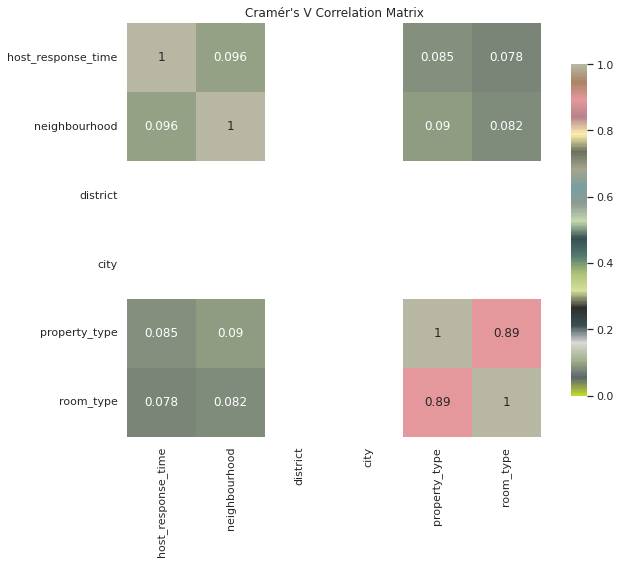

In [0]:

# Convert to a continuous colormap
custom_cmap = LinearSegmentedColormap.from_list("main_palette_map", main_palette, N=256)

# Generate and plot the heatmap
cramer_v_result = cramers_v_matrix(pdf)  
plt.figure(figsize=(10, 8))
sns.heatmap(
    cramer_v_result,
    annot=True,
    cmap=custom_cmap, 
    vmin=0,
    vmax=1,
    square=True,
    cbar_kws={"shrink": 0.8}
)
plt.title("Cramér's V Correlation Matrix")
plt.tight_layout()
plt.show()



#### Conclusion: Cramér’s V Correlation Matrix Analysis

Cramér’s V measures the association strength between categorical variables, ranging from 0 (no association) to 1 (perfect association). It is particularly suited for nominal variables.

##### Strong Association
- `property_type` and `room_type` show a very strong relationship (Cramér’s V ≈ 0.89).
  - This indicates a significant dependency between the two.
  - Likely explanation: certain property types (e.g., entire apartment, shared house) strongly determine the room type (e.g., private room, entire place).
  - These features may carry redundant information and could be combined or one could be dropped if necessary.

##### Weak Associations
- `host_response_time`, `neighbourhood`, `property_type`, and `room_type` show weak associations with each other (Cramér’s V values between 0.078 and 0.096).
  - These low values suggest minimal dependency.
  - Example: `host_response_time` and `property_type` have very limited correlation (Cramér’s V ≈ 0.085), meaning host responsiveness is mostly independent of listing type.

##### No Measurable Association
- `district` and `city` are completely blank in the matrix, indicating:
  - These variables may be missing or removed due to lack of variability or issues during calculation.
  - They currently contribute no measurable categorical interaction and should be reviewed or cleaned.




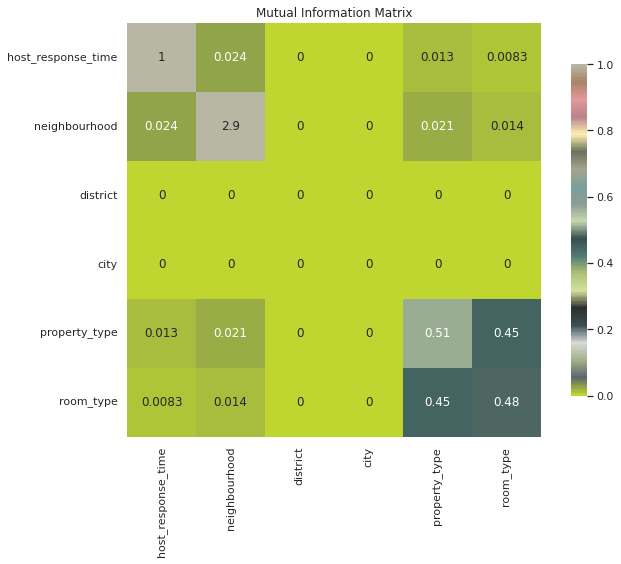

In [0]:

# Compute and plot mutual information matrix
mutual_info_result = mutual_info_matrix(pdf)
plt.figure(figsize=(10, 8))
sns.heatmap(
    mutual_info_result,
    annot=True,
    cmap=custom_cmap,  
    vmin=0,
    vmax=1,
    square=True,
    cbar_kws={"shrink": 0.8}
)
plt.title("Mutual Information Matrix")
plt.tight_layout()
plt.show()


#### Conclusions

The mutual information (MI) matrix measures the dependency between pairs of categorical variables. It is especially useful for identifying non-linear relationships that may not be captured by correlation coefficients.

##### Strong Relationships

- `property_type` and `room_type` show a strong mutual information score (MI ≈ 0.51–0.45).
  - This indicates that knowing the property type provides significant information about the room type, and vice versa.
  - This relationship is intuitive, as certain property types (e.g., apartments, houses) are often associated with specific room types (e.g., private room, entire home).

##### Weak Relationships

- `host_response_time` shows weak relationships with:
  - `property_type` (MI ≈ 0.013)
  - `room_type` (MI ≈ 0.008)
  - `neighbourhood` (MI ≈ 0.024)
  - These relationships are low but not zero, indicating minimal shared information. This could suggest some small structural differences in host behavior across listing types or locations.

##### No Significant Relationships

- `district` and `city` have mutual information values of zero with all other variables.
  - This suggests that these features may be constant, poorly encoded, or not contributing useful categorical variation to the dataset.
  - Further inspection is recommended to verify whether these columns can be removed or re-engineered.


